M76 Homework 5 (due 07/30/2024) \\
Author: Warren Shepard \\
Collaboration: Sri Korandla, Tushar Aggarwal \\
Credit: none \\
Date: 30 July 2024

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# standard imports
import os, random
import numpy as np
import matplotlib.pyplot as plt

# sklearn imports
from sklearn.datasets import *
from sklearn import svm
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.tree import DecisionTreeClassifier

import pandas as pd


# you may need to install the PIL in your environment
# for installation in mamba environment type "mamba install pillow -c conda-forge" in your miniforge prompt
# for installation in conda environment type "conda install pillow -c conda-forge" in your conda prompt or anaconda prompt
# for installation via pip type "pip install pillow" in your terminal
from PIL import Image

# SVM and Kernels

### Objective
Through this project, you will learn to use nonlinear kernels to improve a support vector classifier. The toy examples within this project aim to guide you as you build your intuition for the decision boundaries that can be generated via different kernels.

This project is structured as follows:
#### Part 1: Binary classification of synthetic data
1.1. Generate and explore synthetic data

1.2. SVM with nonlinear kernels
#### Part 2: US Flags
2.1. Load and explore flags data

2.2. SVMs for flag pixel data

2.3. Comparison to decision trees


## Part 1: Binary classification of synthetic data

### Part 1.1: Generate and explore synthetic data
The next cell defines the function `generate_dataset`, which you can use to generate synthetic (i.e., computer generated) data sets for binary classification. It includes eight different methods for data-set generation.
1. Try out each method and visualize the resulting data set. For the 'swiss' and 'scurve' data sets, try out two different values of the keyword argument `splits`.
2. Comment on WHETHER and WHY you anticipate this data set to be relatively easy or relatively hard to classify with a linear classifier.
3. Comment on WHETHER and WHY you anticipate this data set to be relatively easy or relatively hard to classify with a nonlinear classifier.

In [ ]:
# Function to convert an array of real numbers into an array of 0s and 1s
def binarize(arr, split=10):
    # Calculate the decile thresholds
    percentiles = int(np.ceil(100/split))
    split_points = np.arange(0, 100+percentiles, percentiles)
    split_points[split_points>100] = 100
    deciles = np.percentile(arr, split_points)

    # Create a new array to hold the modified values
    modified_arr = np.zeros_like(arr)

    # Iterate through each decile range and set values accordingly
    for i in range(split):
        print(i)
        if i == split-1:
            if i % 2 == 0:
                # Set values in even deciles to 0
                modified_arr[(arr >= deciles[i])] = 0
            else:
                # Set values in odd deciles to 1
                modified_arr[(arr >= deciles[i])] = 1
        else:
            if i % 2 == 0:
                # Set values in even deciles to 0
                modified_arr[(arr >= deciles[i]) & (arr < deciles[i + 1])] = 0
            else:
                # Set values in odd deciles to 1
                modified_arr[(arr >= deciles[i]) & (arr < deciles[i + 1])] = 1

    return modified_arr

# Function to generate datasets
def generate_dataset(dataset_type, n_samples=300, noise=0.1, split=10, random_state=0):
    if dataset_type == 'linearly_separable':
        X, y = make_classification(n_samples=n_samples, n_features=2, n_redundant=0, n_informative=2,
                                   random_state=random_state, n_clusters_per_class=1)
    elif dataset_type == 'blobs':
        X, y = make_blobs(n_samples=[n_samples//2, n_samples//2], random_state=random_state, cluster_std=noise)
    elif dataset_type == 'quantiles':
        X, y = make_gaussian_quantiles(n_samples=n_samples, n_classes=2, cov=noise, random_state=random_state)
    elif dataset_type == 'moons':
        X, y = make_moons(n_samples=n_samples, noise=noise, random_state=random_state)
    elif dataset_type == 'circles':
        X, y = make_circles(n_samples=n_samples, noise=noise, factor=0.5, random_state=random_state)
    elif dataset_type == 'unstructured':
        X, y = np.random.random(size=(n_samples, 2)), np.random.randint(0,2, size=(n_samples))
    elif dataset_type == 'swiss':
        X, y = make_swiss_roll(n_samples=n_samples, noise=noise, random_state=random_state)
        X=np.array([X[:,0],X[:,2]]).T
        y = binarize(y, split=split)
    elif dataset_type == 'scurve':
        X, y = make_s_curve(n_samples=n_samples, noise=noise, random_state=random_state)
        X=np.array([X[:,0],X[:,2]]).T
        y = binarize(y, split=split)
    else:
        raise ValueError("Invalid dataset type")

    X = StandardScaler().fit_transform(X)
    return X, y

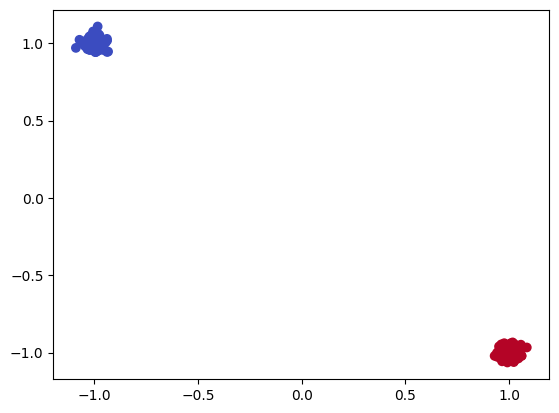

In [ ]:
# Generate and visualize data blobs
blobs_X, blobs_y = generate_dataset('blobs', random_state=42)

# Plot the data
plt.scatter(blobs_X[:, 0], blobs_X[:, 1], c=blobs_y, cmap=plt.cm.coolwarm)

I anticipate that this data set will be easy to classify with a linear classifier as the two sets of data are grouped in distinct locations with no overlap in their locations.

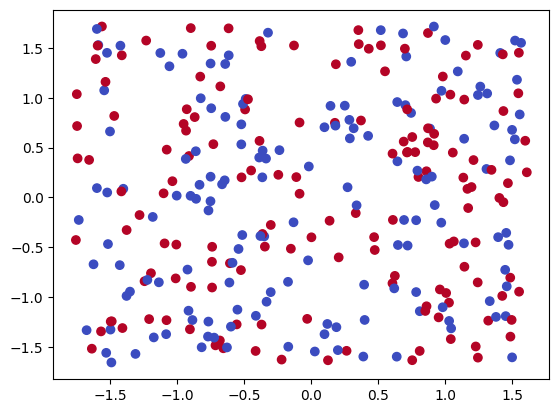

In [ ]:
# Generate and visualize unstructured data
unstructured_X, unstructured_y = generate_dataset('unstructured', random_state=42)

plt.scatter(unstructured_X[:, 0], unstructured_X[:, 1], c=unstructured_y, cmap=plt.cm.coolwarm)

I anticipate that this data set will be difficult to classify with either a linear or non linear classifier, as both datasets are generally very random and have significant overlap over their locations.

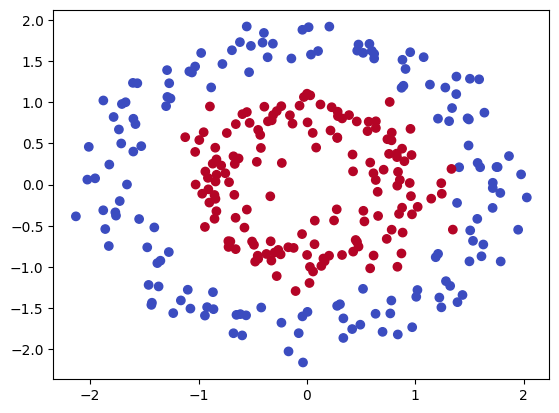

In [ ]:
# Generate and visualize circles data set
circles_X, circles_y = generate_dataset('circles', random_state=42)

plt.scatter(circles_X[:, 0], circles_X[:, 1], c=circles_y, cmap=plt.cm.coolwarm)

I anticipate that this data set will be difficult to classify with a linear classifier as there is no clear linear boundary that adequately separates points of the two data sets. However, I anticipate that with the correct non-linear classifier, this data will not be very difficult to classify. This is because the two datasets generally do not have much overlap and follow predictible patterns, even if they are non-linear.

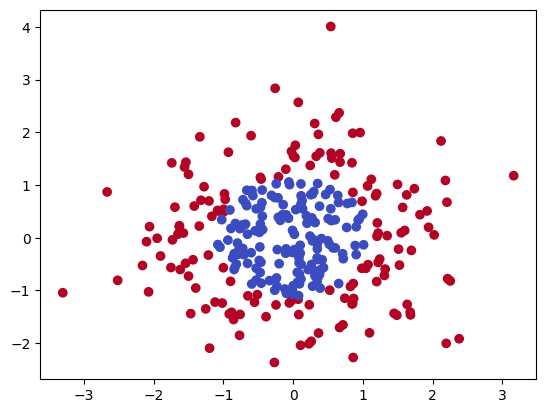

In [ ]:
# Generate and visualize Gaussian quantiles
gaussian_X, gaussain_y = generate_dataset('quantiles', random_state=42)

plt.scatter(gaussian_X[:, 0], gaussian_X[:, 1], c=gaussain_y, cmap=plt.cm.coolwarm)

I anticipate that this data set will be difficult to classify with a linear classifier since there is no clear linear boundary that can be made between the two data sets. I anticipate this data to be not very difficult to classify with a non-linear classifier, as there is not very much overlap between the two data sets and they follow a somewhat predictable pattern.

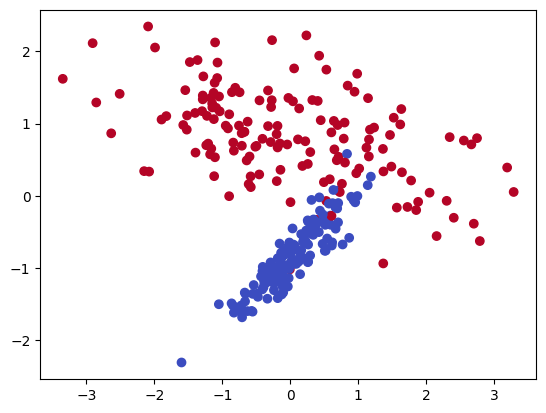

In [ ]:
# Generate and visualize linearly separable data
linear_sep_X, linear_sep_y = generate_dataset('linearly_separable', random_state=42)

plt.scatter(linear_sep_X[:, 0], linear_sep_X[:, 1], c=linear_sep_y, cmap=plt.cm.coolwarm)

I anticipate this dataset to be OK/good to classiy with a linear classifier, as there is a clear way to mostly split the data diagonally, with minimal but still some error. A nonlinear classifier should be a bit better, as it will allow for a slightly curved and better fit boundary which will result in lower error.

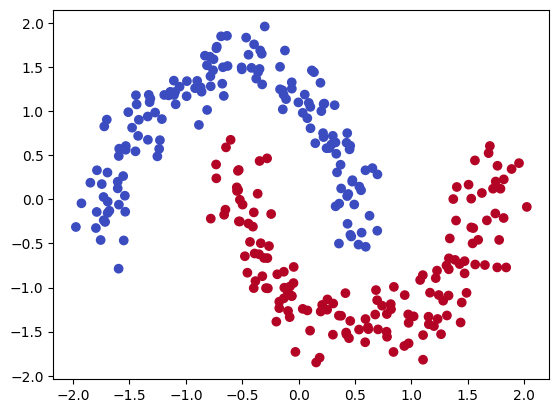

In [ ]:
# Generate and visualize moons data set
moons_X, moons_y = generate_dataset('moons', random_state=42)

plt.scatter(moons_X[:, 0], moons_X[:, 1], c=moons_y, cmap=plt.cm.coolwarm)

I anticipate that this data set to be OK to classify with a linear classifier, but with some error (it's easy to see how to draw a line with minimal erorr). A non-linear classifier should have no probelm classiying this dataset since there is really only one clear "curve" to follow!

0
1


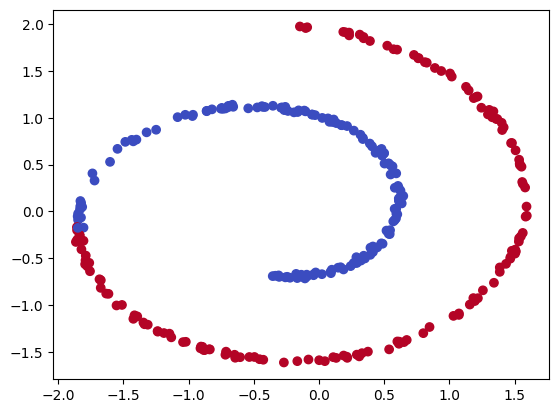

In [ ]:
# Generate and visualize swiss role with 2 split sets
swiss_2_X, swiss_2_y = generate_dataset('swiss', random_state=42, split=2)

plt.scatter(swiss_2_X[:, 0], swiss_2_X[:, 1], c=swiss_2_y, cmap=plt.cm.coolwarm)

I anticipate that this data set to be hard to classiy with a linear classifier, but possible with medium to high error since there are only two "chunks" of data, but a line cannot seperate them with no error. Again, a non-linear classifier should have no problem classifying this data, as there is a simple "curve" to follow.

0
1


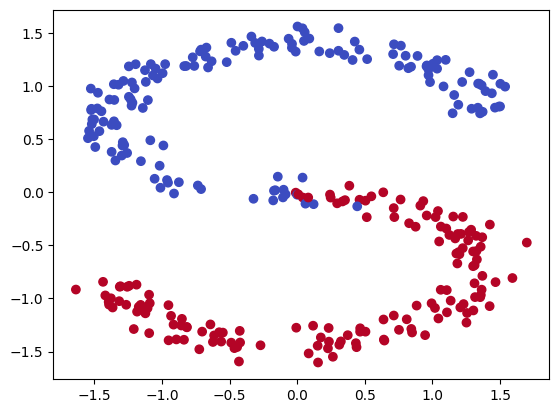

In [ ]:
# Generate and visualize S curve with 2 split sets
s_curve_2_X, s_curve_2_y = generate_dataset('scurve', random_state=42, split=2)

plt.scatter(s_curve_2_X[:, 0], s_curve_2_X[:, 1], c=s_curve_2_y, cmap=plt.cm.coolwarm)

I anticipate that this data set to be easy to classify with both linear and nonlinear models, as there is a clear split down the middle using a diagonal line. For nonlinear models, there are plenty of ways to split the data into two chuncks with curved lines!

0
1
2
3
4
5
6
7
8
9


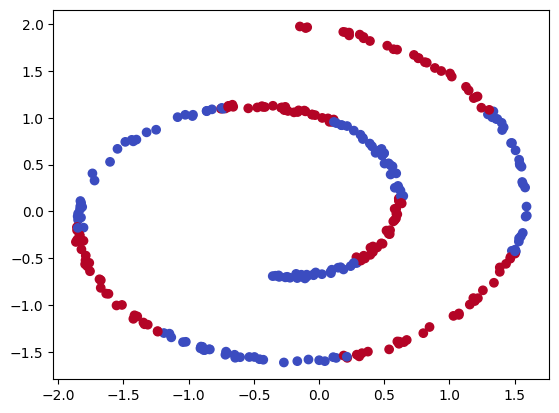

In [ ]:
# Generate and visualize swiss role with 10 split sets
swiss_10_X, swiss_10_y = generate_dataset('swiss', random_state=42, split=10)

plt.scatter(swiss_10_X[:, 0], swiss_10_X[:, 1], c=swiss_10_y, cmap=plt.cm.coolwarm)

I anticipate that this data set to be hard to classify with a linear model, as it is split into many chunks and there are no easy lines to draw to split it. It will be possible, but also potentially challenging (becuase of the high complexity) to fit it with a nonlinear model. However, once the parameters are set correctly, this will be far easier and more accurate than a linear classifier!

0
1
2
3
4
5
6
7
8
9


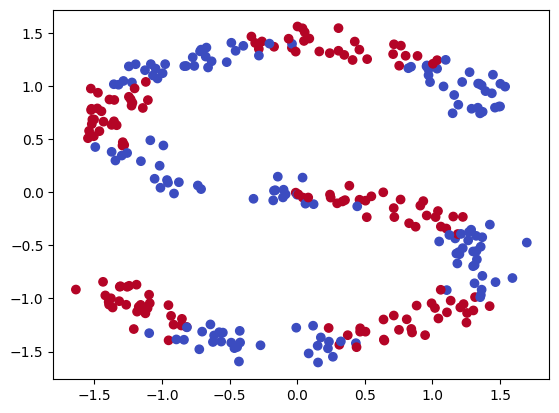

In [ ]:
# Generate and visualize S curve with 10 split sets
s_curve_10_X, s_curve_10_y = generate_dataset('scurve', random_state=42, split=10)

plt.scatter(s_curve_10_X[:, 0], s_curve_10_X[:, 1], c=s_curve_10_y, cmap=plt.cm.coolwarm)

I anticipate that this data set to be OK/easy to classiy with a linear classiier as there are some clear ways to vertically split the data, but there still may be some error (particuarly on the left and right sides). However, a non-linear classifier will be able to do it with no problems!

### Part 1.2: SVM with nonlinear kernels

The next cell defines the function `kernel_comparison`, which you can use to visually compare the decision boundaries generated by SVMs with different kernels.

1. The kernel comparison currently produces only visual results. Add code to the function so that it also outputs train and test accuracy of the different SVMs. (Note: Think carefully about where the right place in the code is to do a train-test split.)
2. Run the kernel comparison for the data sets from Part 1.1. Do the results confirm or contradict your expectations that you formulated in Part 1.1.? Did any of the results surprise you?
3. Consult sklearn's documentation to learn how the keyword arguments `degree` and `gamma` affect your classifier. Try out a few different values of these parameters. How and what can one infer from the shape of the decision boundary about the classifier's `degree` or `gamma`?

In [ ]:
# CHANGES: added degree and gamma parameters
# PT 2 CHANGES: updated for flags

def kernel_comparison(X, y, support_vectors=True, tight_box=False, if_flag=False, degree=3, gamma=3, plot_boundaries=True):

    # Train test split should be at BEGINING of the function
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # dictionary to keep track of accuracy
    dict = {}

    if if_flag:
      fig, axs = plt.subplots(2, 2)
    else:
      fig = plt.figure(figsize=(10,3))

    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = svm.SVC(kernel=kernel, degree=degree, gamma=gamma).fit(X_train, y_train)

        # Compute train and test accuracy
        y_train_pred = clf.predict(X_train)
        y_test_pred = clf.predict(X_test)
        train_accuracy = accuracy_score(y_train, y_train_pred)
        test_accuracy = accuracy_score(y_test, y_test_pred)
        dict[kernel] = [train_accuracy, test_accuracy]

        if if_flag:
            ax = axs[ikernel//2, ikernel%2]
        else:
            # Settings for plotting
            ax = plt.subplot(1,4,1+ikernel)
            #x_min, x_max, y_min, y_max = -3, 3, -3, 3
            #ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

        # Plot decision boundary and margins
        common_params = {"estimator": clf, "X": X, "ax": ax}
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="predict",
            plot_method="pcolormesh",
            alpha=0.3,
        )
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="decision_function",
            plot_method="contour",
            levels=[-1, 0, 1],
            colors=["k", "k", "k"],
            linestyles=["--", "-", "--"],
        )

        if support_vectors:
            # Plot bigger circles around samples that serve as support vectors
            ax.scatter(
                clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=150,
                facecolors="none",
                edgecolors="k",
            )

        # Plot samples by color and add legend
        ax.scatter(X[:, 0], X[:, 1], c=y, s=30, edgecolors="k")
        ax.set_title(kernel)
        ax.axis('off')
        if tight_box:
            ax.set_xlim([X[:, 0].min(), X[:, 0].max()])
            ax.set_ylim([X[:, 1].min(), X[:, 1].max()])

    fig.show()

    return dict, fig

DATA BLOBS
{'linear': [1.0, 1.0], 'poly': [1.0, 1.0], 'rbf': [1.0, 1.0], 'sigmoid': [1.0, 1.0]}


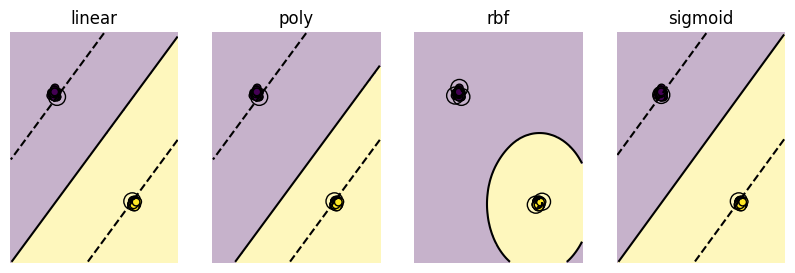

In [ ]:
# data blobs
print("DATA BLOBS")
blobs_dict, blobs_fig = kernel_comparison(blobs_X, blobs_y)
print(blobs_dict)

UNSTRUCTURED DATA
{'linear': [0.5619047619047619, 0.5555555555555556], 'poly': [0.5619047619047619, 0.5555555555555556], 'rbf': [0.7095238095238096, 0.5222222222222223], 'sigmoid': [0.4857142857142857, 0.5555555555555556]}


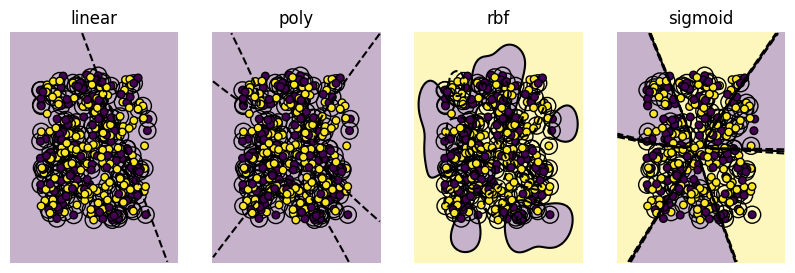

In [ ]:
# unstructured data
print("UNSTRUCTURED DATA")
unstructured_dict, unstructured_fig = kernel_comparison(unstructured_X, unstructured_y)
print(unstructured_dict)

CIRCLES DATA SET
{'linear': [0.5333333333333333, 0.4222222222222222], 'poly': [0.5333333333333333, 0.4222222222222222], 'rbf': [0.9904761904761905, 1.0], 'sigmoid': [0.48095238095238096, 0.5]}


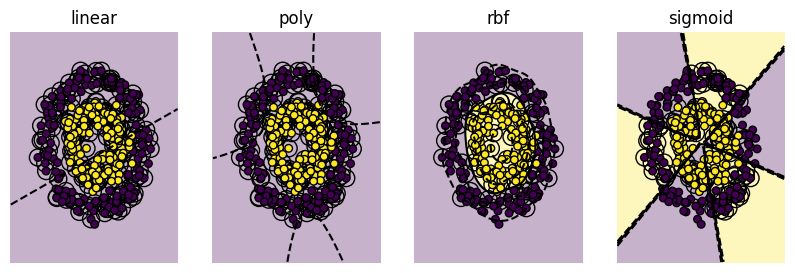

In [ ]:
# circles data set
print("CIRCLES DATA SET")
circles_dict, circles_fig = kernel_comparison(circles_X, circles_y)
print(circles_dict)

GAUSSIAN QUANTILES
{'linear': [0.5095238095238095, 0.4777777777777778], 'poly': [0.6523809523809524, 0.6333333333333333], 'rbf': [0.9666666666666667, 0.9666666666666667], 'sigmoid': [0.4666666666666667, 0.5]}


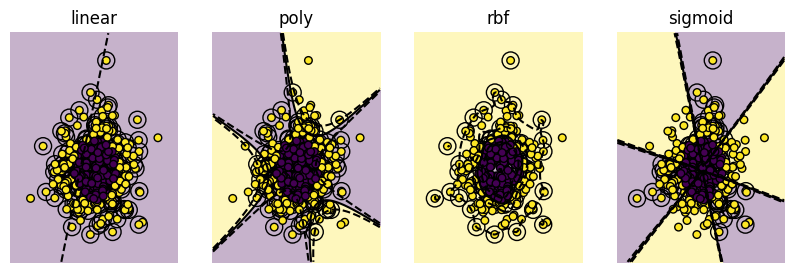

In [ ]:
# Gaussian quantiles
print("GAUSSIAN QUANTILES")
gaussian_dict, gaussian_fig = kernel_comparison(gaussian_X, gaussain_y)
print(gaussian_dict)

LINEARLY SEPARABLE DATA
{'linear': [0.919047619047619, 0.9555555555555556], 'poly': [0.9285714285714286, 0.8888888888888888], 'rbf': [0.9809523809523809, 0.9555555555555556], 'sigmoid': [0.8571428571428571, 0.8555555555555555]}


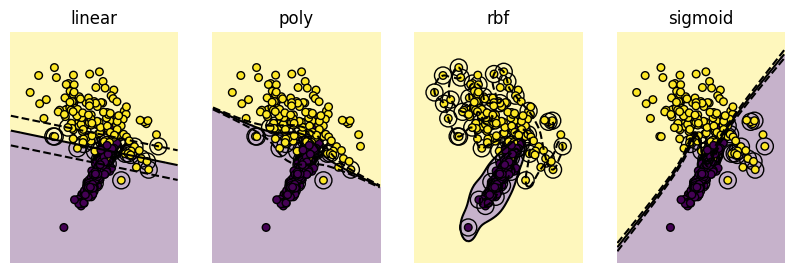

In [ ]:
# linearly separable data
print("LINEARLY SEPARABLE DATA")
linear_sep_dict, linear_sep_fig = kernel_comparison(linear_sep_X, linear_sep_y)
print(linear_sep_dict)

MOONS DATA SET
{'linear': [0.8666666666666667, 0.9], 'poly': [0.8904761904761904, 0.9444444444444444], 'rbf': [1.0, 1.0], 'sigmoid': [0.6, 0.7]}


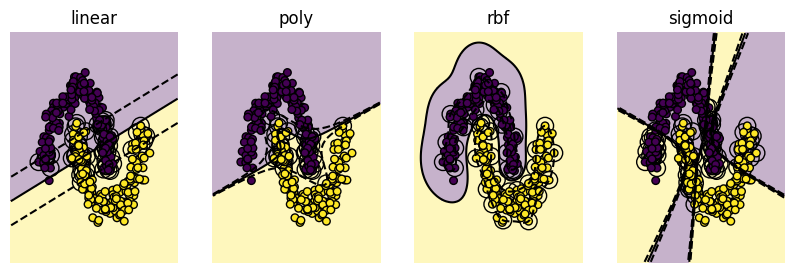

In [ ]:
# moons data set
print("MOONS DATA SET")
moons_dict, moons_fig = kernel_comparison(moons_X, moons_y)
print(moons_dict)

SWISS 2 DATA SET
{'linear': [0.580952380952381, 0.5888888888888889], 'poly': [0.780952380952381, 0.8222222222222222], 'rbf': [0.9952380952380953, 0.9888888888888889], 'sigmoid': [0.49047619047619045, 0.4222222222222222]}


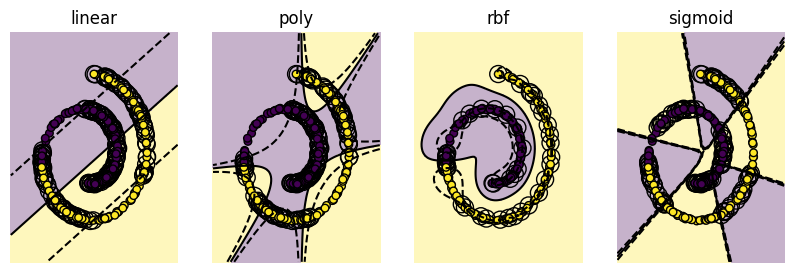

In [ ]:
# swiss 2 data set
print("SWISS 2 DATA SET")
swiss_2_dict, swiss_2_fig = kernel_comparison(swiss_2_X, swiss_2_y)
print(swiss_2_dict)

SWISS 10 DATA SET
{'linear': [0.4714285714285714, 0.5444444444444444], 'poly': [0.7952380952380952, 0.7444444444444445], 'rbf': [0.9476190476190476, 0.9111111111111111], 'sigmoid': [0.2523809523809524, 0.28888888888888886]}


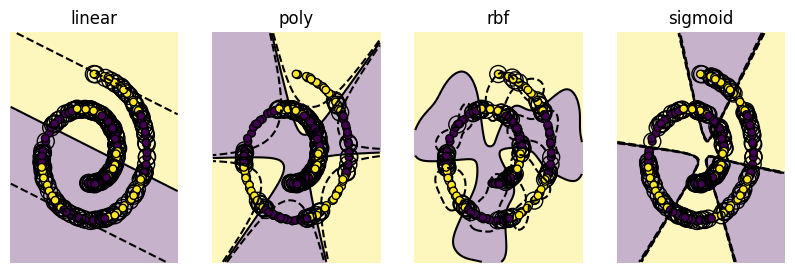

In [ ]:
# swiss 10 data set
print("SWISS 10 DATA SET")
swiss_10_dict, swiss_10_fig = kernel_comparison(swiss_10_X, swiss_10_y)
print(swiss_10_dict)

S CURVE 2 DATA SET
{'linear': [0.9904761904761905, 0.9666666666666667], 'poly': [0.9619047619047619, 0.9666666666666667], 'rbf': [0.9904761904761905, 0.9555555555555556], 'sigmoid': [0.7142857142857143, 0.7888888888888889]}


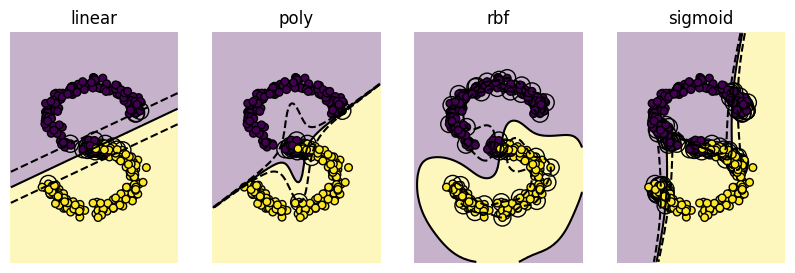

In [ ]:
# s curve 2 data set
print("S CURVE 2 DATA SET")
s_curve_2_dict, s_curve_2_fig = kernel_comparison(s_curve_2_X, s_curve_2_y)
print(s_curve_2_dict)

S CURVE 10 DATA SET
{'linear': [0.5, 0.5666666666666667], 'poly': [0.7380952380952381, 0.7], 'rbf': [0.9095238095238095, 0.8777777777777778], 'sigmoid': [0.45714285714285713, 0.4888888888888889]}


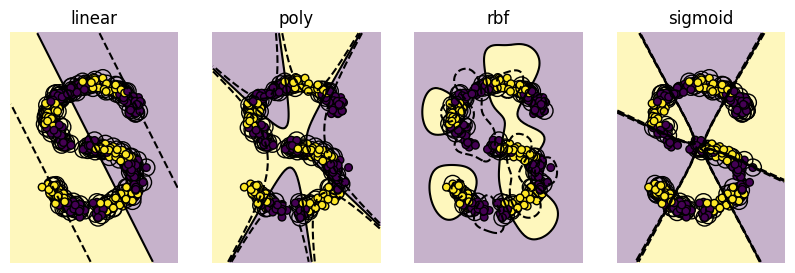

In [ ]:
# s curve 10 data set
print("S CURVE 10 DATA SET")
s_curve_10_dict, s_curve_10_fig = kernel_comparison(s_curve_10_X, s_curve_10_y)
print(s_curve_10_dict)

To summarize the results of the kernel comparison, [ADD SOME TEXT HERE].

DATA BLOBS
Degree:  1
{'linear': [1.0, 1.0], 'poly': [1.0, 1.0], 'rbf': [1.0, 1.0], 'sigmoid': [1.0, 1.0]}
Degree:  5
{'linear': [1.0, 1.0], 'poly': [1.0, 1.0], 'rbf': [1.0, 1.0], 'sigmoid': [1.0, 1.0]}
Degree:  9
{'linear': [1.0, 1.0], 'poly': [1.0, 1.0], 'rbf': [1.0, 1.0], 'sigmoid': [1.0, 1.0]}
Gamma:  1
{'linear': [1.0, 1.0], 'poly': [1.0, 1.0], 'rbf': [1.0, 1.0], 'sigmoid': [1.0, 1.0]}
Gamma:  5
{'linear': [1.0, 1.0], 'poly': [1.0, 1.0], 'rbf': [1.0, 1.0], 'sigmoid': [1.0, 1.0]}
Gamma:  9
{'linear': [1.0, 1.0], 'poly': [1.0, 1.0], 'rbf': [1.0, 1.0], 'sigmoid': [1.0, 1.0]}


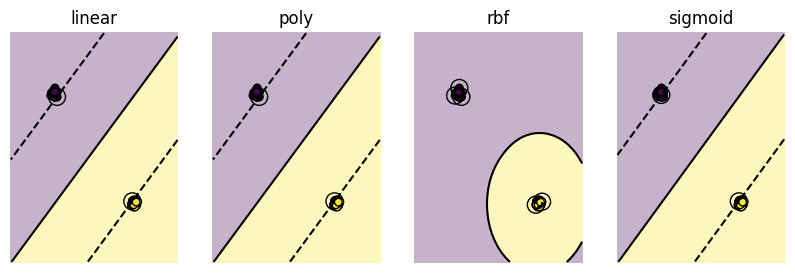

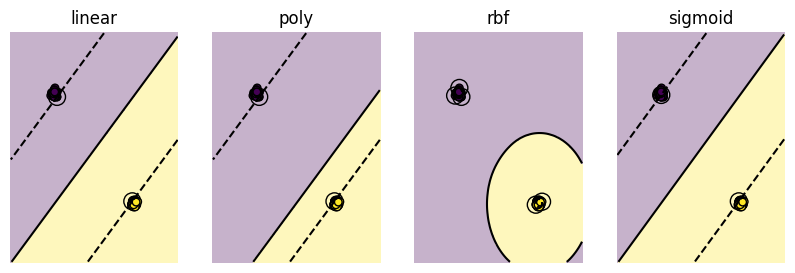

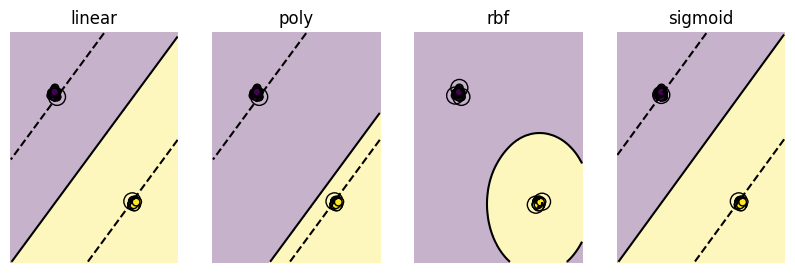

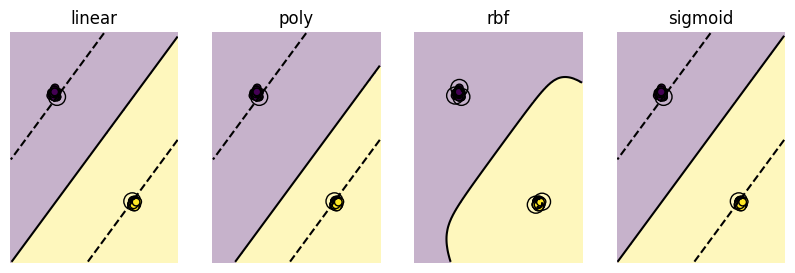

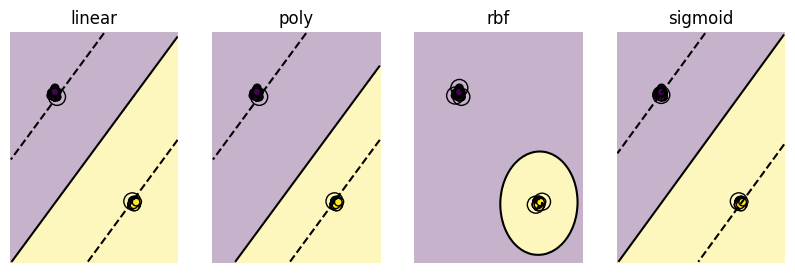

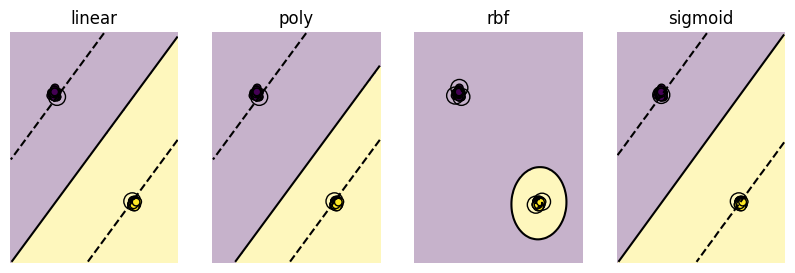

In [ ]:
# Examine effect of degree and gamma keyword

# data blobs
print("DATA BLOBS")

# first keep gamma constant and increment degree
for d in range(1, 10, 4):
    print("Degree: ", d)
    blobs_dict, blobs_fig = kernel_comparison(blobs_X, blobs_y, degree=d, gamma=3)
    print(blobs_dict)
    blobs_fig.show()

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Gamma: ", g)
    blobs_dict, blobs_fig = kernel_comparison(blobs_X, blobs_y, degree=3, gamma=g)
    print(blobs_dict)

UNSTRUCTURED DATA
Degree:  1
{'linear': [0.5523809523809524, 0.4777777777777778], 'poly': [0.5523809523809524, 0.4777777777777778], 'rbf': [0.6904761904761905, 0.4111111111111111], 'sigmoid': [0.5238095238095238, 0.4777777777777778]}
Degree:  3
{'linear': [0.5523809523809524, 0.4777777777777778], 'poly': [0.5238095238095238, 0.4222222222222222], 'rbf': [0.6904761904761905, 0.4111111111111111], 'sigmoid': [0.5238095238095238, 0.4777777777777778]}
Degree:  5
{'linear': [0.5523809523809524, 0.4777777777777778], 'poly': [0.5666666666666667, 0.45555555555555555], 'rbf': [0.6904761904761905, 0.4111111111111111], 'sigmoid': [0.5238095238095238, 0.4777777777777778]}
Degree:  7
{'linear': [0.5523809523809524, 0.4777777777777778], 'poly': [0.5333333333333333, 0.4777777777777778], 'rbf': [0.6904761904761905, 0.4111111111111111], 'sigmoid': [0.5238095238095238, 0.4777777777777778]}
Gamma:  1
{'linear': [0.5523809523809524, 0.4777777777777778], 'poly': [0.5238095238095238, 0.4222222222222222], 'rbf

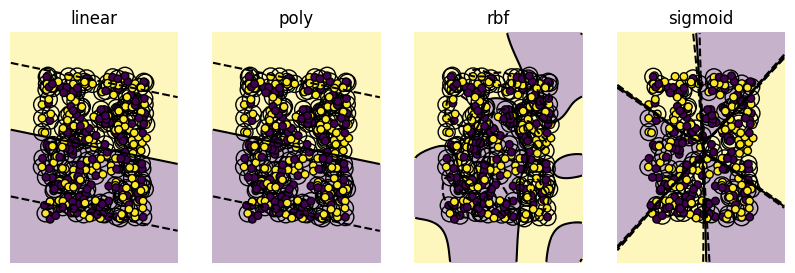

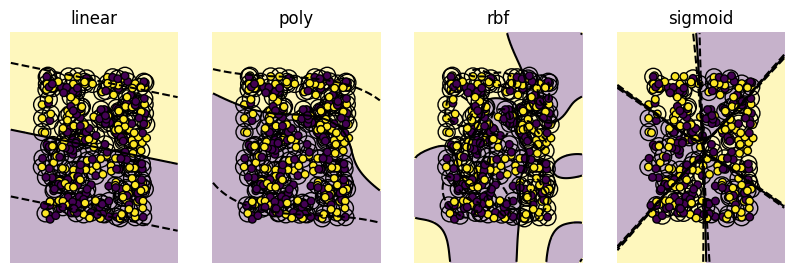

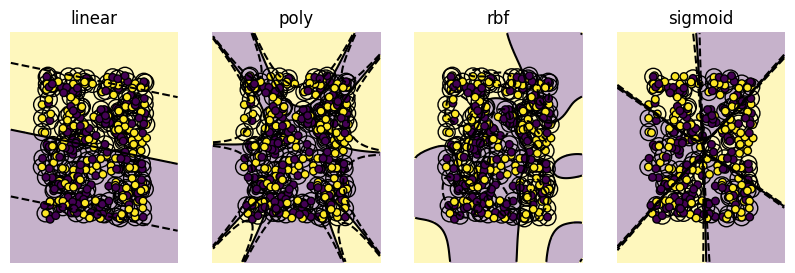

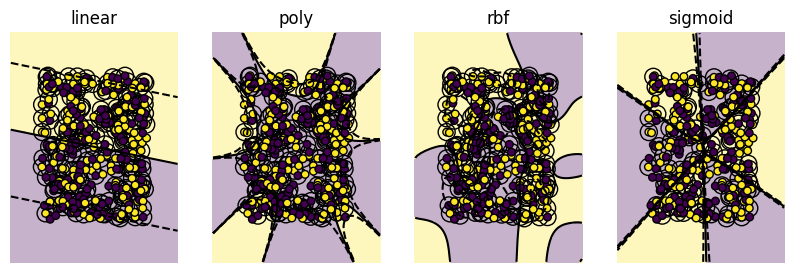

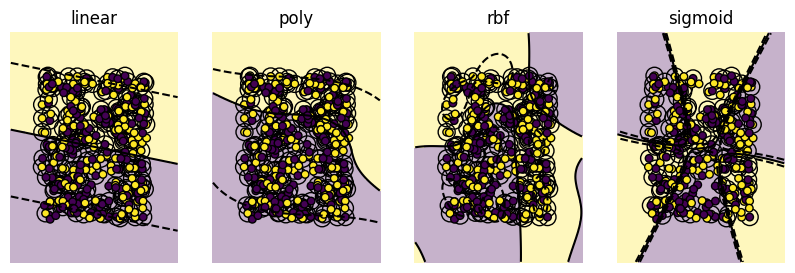

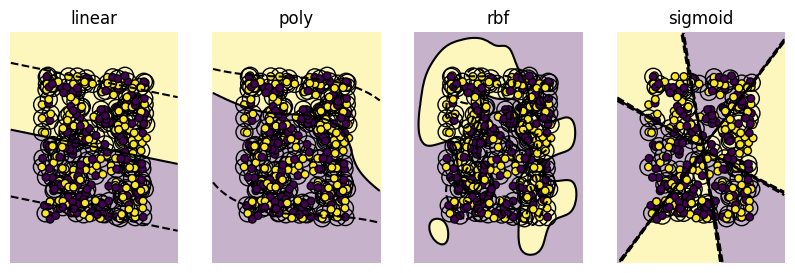

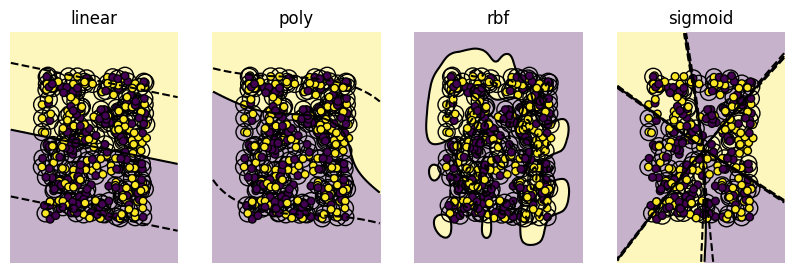

In [ ]:
# unstructured data
print("UNSTRUCTURED DATA")

# first keep gamma constant and increment degree
for d in range(1, 8, 2):
    print("Degree: ", d)
    unstructured_dict, unstructured_fig = kernel_comparison(unstructured_X, unstructured_y, degree=d, gamma=3)
    print(unstructured_dict)

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Gamma: ", g)
    unstructured_dict, unstructured_fig = kernel_comparison(unstructured_X, unstructured_y, degree=3, gamma=g)
    print(unstructured_dict)

CIRCLES DATA SET
Degree:  1
{'linear': [0.5333333333333333, 0.4222222222222222], 'poly': [0.5333333333333333, 0.4222222222222222], 'rbf': [0.9904761904761905, 1.0], 'sigmoid': [0.48095238095238096, 0.5]}
Degree:  3
{'linear': [0.5333333333333333, 0.4222222222222222], 'poly': [0.5333333333333333, 0.4222222222222222], 'rbf': [0.9904761904761905, 1.0], 'sigmoid': [0.48095238095238096, 0.5]}
Degree:  5
{'linear': [0.5333333333333333, 0.4222222222222222], 'poly': [0.5333333333333333, 0.4222222222222222], 'rbf': [0.9904761904761905, 1.0], 'sigmoid': [0.48095238095238096, 0.5]}
Gamma:  1
{'linear': [0.5333333333333333, 0.4222222222222222], 'poly': [0.5333333333333333, 0.4222222222222222], 'rbf': [0.9857142857142858, 1.0], 'sigmoid': [0.47619047619047616, 0.5111111111111111]}
Gamma:  5
{'linear': [0.5333333333333333, 0.4222222222222222], 'poly': [0.5333333333333333, 0.4222222222222222], 'rbf': [0.9904761904761905, 1.0], 'sigmoid': [0.48095238095238096, 0.5]}
Gamma:  9
{'linear': [0.53333333333

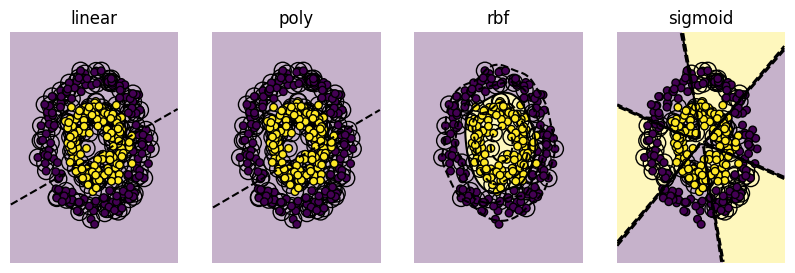

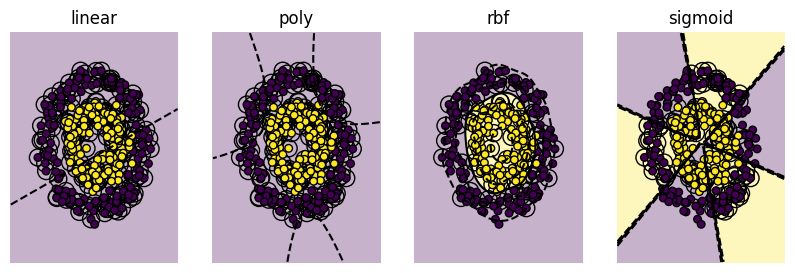

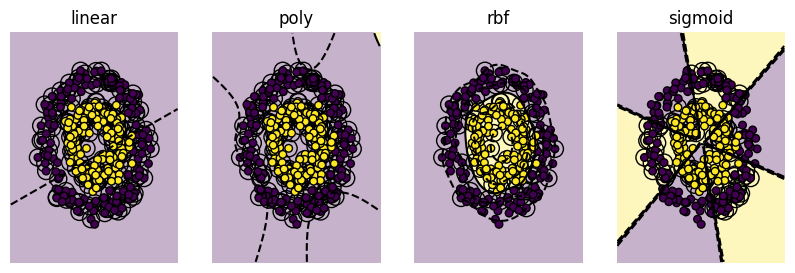

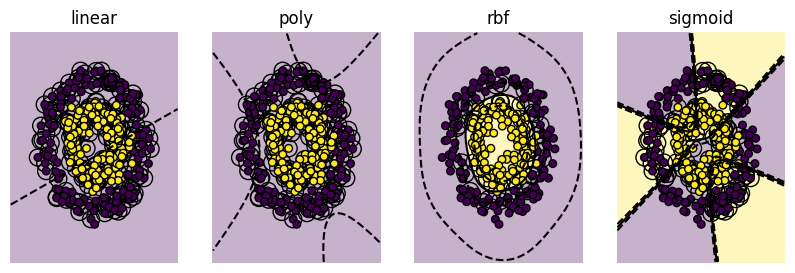

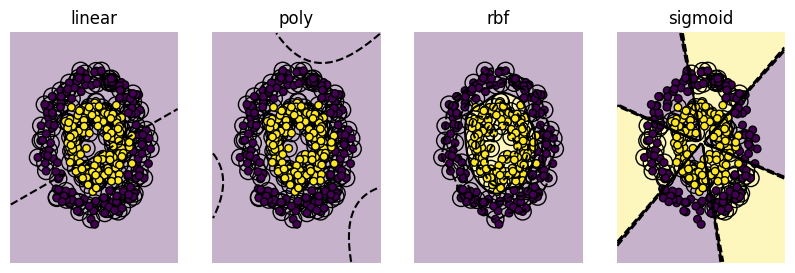

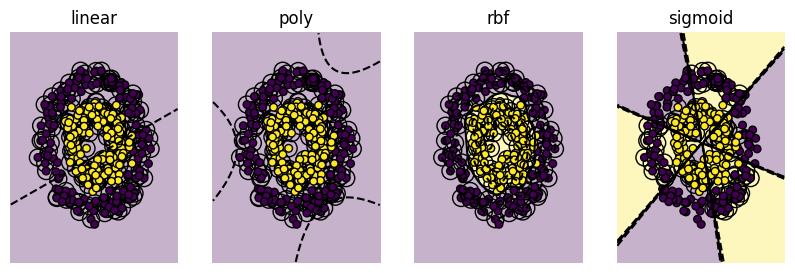

In [ ]:
# circle data set
print("CIRCLES DATA SET")

# first keep gamma constant and increment degree
for d in range(1, 6, 2):
    print("Degree: ", d)
    circles_dict, circles_fig = kernel_comparison(circles_X, circles_y, degree=d, gamma=3)
    print(circles_dict)

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Gamma: ", g)
    circles_dict, circles_fig = kernel_comparison(circles_X, circles_y, degree=3, gamma=g)
    print(circles_dict)


GAUSSIAN QUANTILES
Degree:  1
{'linear': [0.5095238095238095, 0.4777777777777778], 'poly': [0.5095238095238095, 0.4777777777777778], 'rbf': [0.9666666666666667, 0.9666666666666667], 'sigmoid': [0.4666666666666667, 0.5]}
Degree:  3
{'linear': [0.5095238095238095, 0.4777777777777778], 'poly': [0.6523809523809524, 0.6333333333333333], 'rbf': [0.9666666666666667, 0.9666666666666667], 'sigmoid': [0.4666666666666667, 0.5]}
Degree:  5
{'linear': [0.5095238095238095, 0.4777777777777778], 'poly': [0.5761904761904761, 0.5666666666666667], 'rbf': [0.9666666666666667, 0.9666666666666667], 'sigmoid': [0.4666666666666667, 0.5]}
Gamma:  1
{'linear': [0.5095238095238095, 0.4777777777777778], 'poly': [0.6523809523809524, 0.6333333333333333], 'rbf': [0.9571428571428572, 0.9555555555555556], 'sigmoid': [0.49047619047619045, 0.5555555555555556]}
Gamma:  5
{'linear': [0.5095238095238095, 0.4777777777777778], 'poly': [0.6523809523809524, 0.6333333333333333], 'rbf': [0.9809523809523809, 0.9666666666666667], 

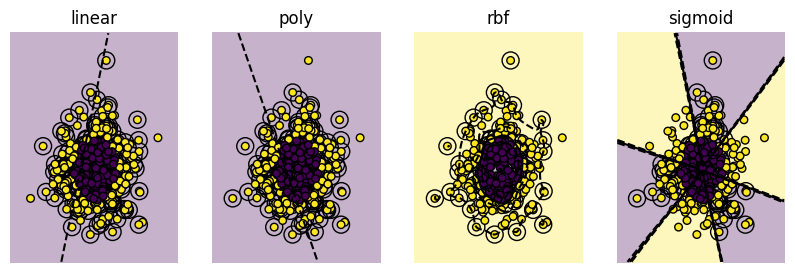

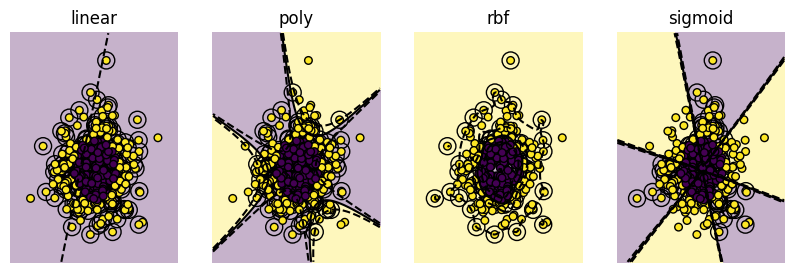

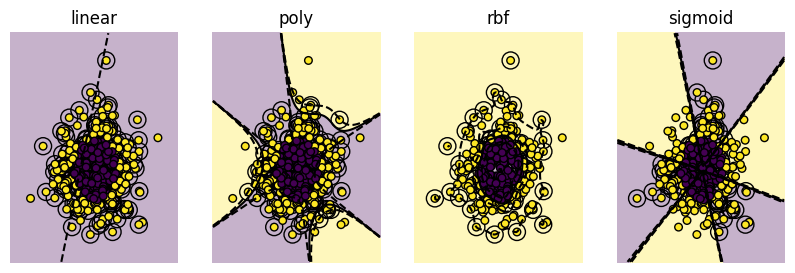

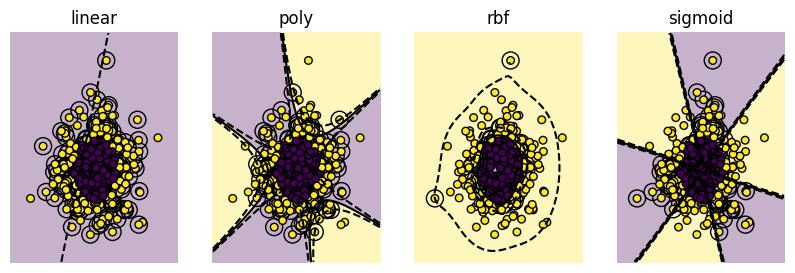

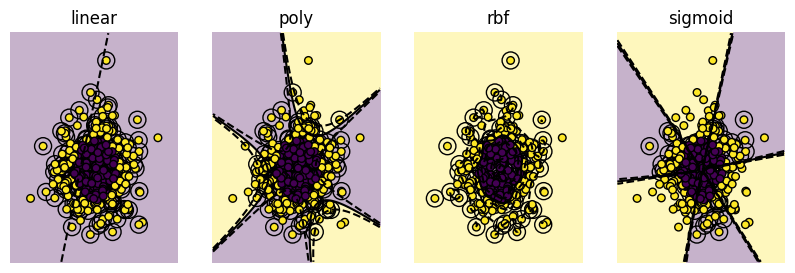

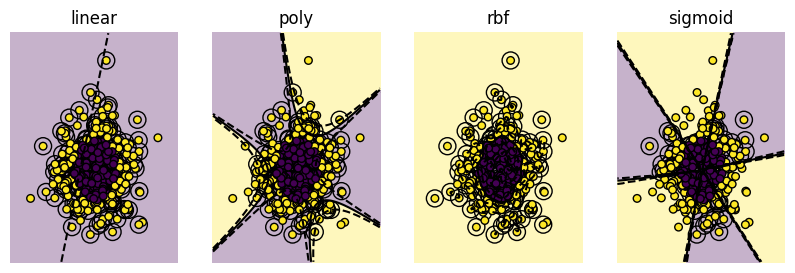

In [ ]:
# gaussian data set
print("GAUSSIAN QUANTILES")

# first keep gamma constant and increment degree
for d in range(1, 6, 2):
    print("Degree: ", d)
    gaussian_dict, gaussian_fig = kernel_comparison(gaussian_X, gaussain_y, degree=d, gamma=3)
    print(gaussian_dict)

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Gamma: ", g)
    gaussian_dict, gaussian_fig = kernel_comparison(gaussian_X, gaussain_y, degree=3, gamma=g)
    print(gaussian_dict)

LINEARLY SEPARABLE DATA
Degree:  1
{'linear': [0.919047619047619, 0.9555555555555556], 'poly': [0.919047619047619, 0.9555555555555556], 'rbf': [0.9809523809523809, 0.9555555555555556], 'sigmoid': [0.8571428571428571, 0.8555555555555555]}
Degree:  3
{'linear': [0.919047619047619, 0.9555555555555556], 'poly': [0.9285714285714286, 0.8888888888888888], 'rbf': [0.9809523809523809, 0.9555555555555556], 'sigmoid': [0.8571428571428571, 0.8555555555555555]}
Degree:  5
{'linear': [0.919047619047619, 0.9555555555555556], 'poly': [0.9, 0.8555555555555555], 'rbf': [0.9809523809523809, 0.9555555555555556], 'sigmoid': [0.8571428571428571, 0.8555555555555555]}
Gamma:  1
{'linear': [0.919047619047619, 0.9555555555555556], 'poly': [0.919047619047619, 0.8888888888888888], 'rbf': [0.9809523809523809, 0.9555555555555556], 'sigmoid': [0.8238095238095238, 0.7888888888888889]}
Gamma:  5
{'linear': [0.919047619047619, 0.9555555555555556], 'poly': [0.9285714285714286, 0.8888888888888888], 'rbf': [0.980952380952

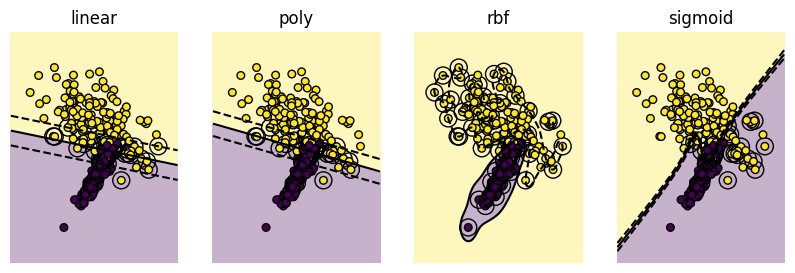

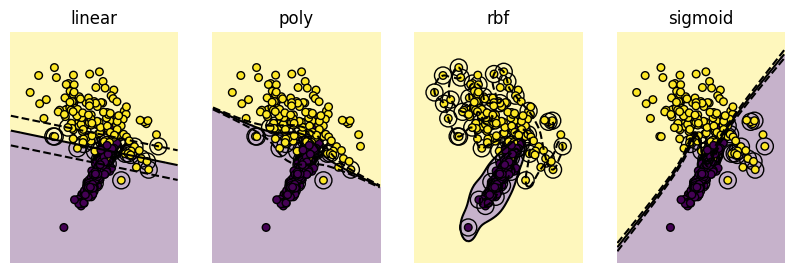

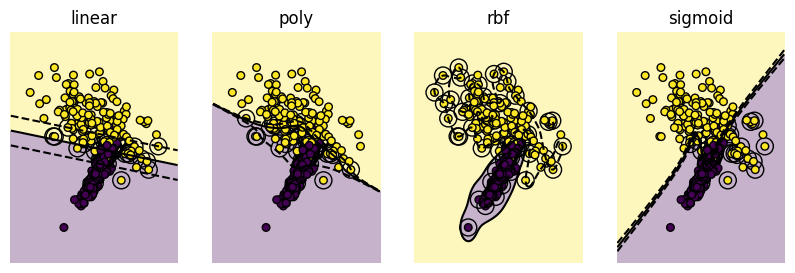

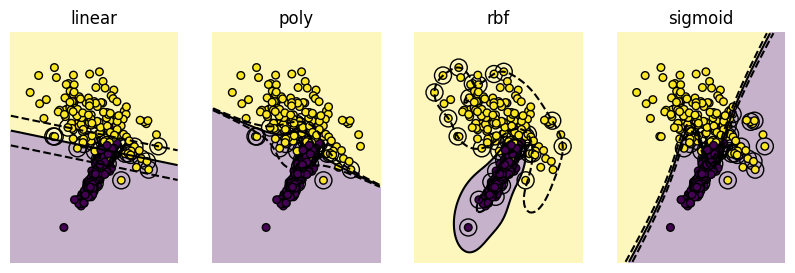

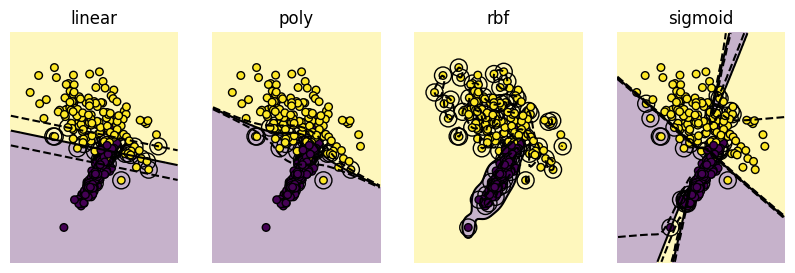

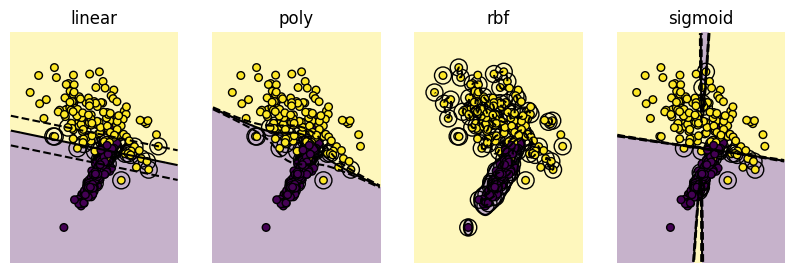

In [ ]:
# linearly seperable data set
print("LINEARLY SEPARABLE DATA")

# first keep gamma constant and increment degree
for d in range(1, 6, 2):
    print("Degree: ", d)
    linear_sep_dict, linear_sep_fig = kernel_comparison(linear_sep_X, linear_sep_y, degree=d, gamma=3)
    print(linear_sep_dict)

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Gamma: ", g)
    linear_sep_dict, linear_sep_fig = kernel_comparison(linear_sep_X, linear_sep_y, degree=3, gamma=g)
    print(linear_sep_dict)

MOON DATA SET
Degree:  1
{'linear': [0.8666666666666667, 0.9], 'poly': [0.8666666666666667, 0.9111111111111111], 'rbf': [1.0, 1.0], 'sigmoid': [0.6, 0.7]}
Degree:  3
{'linear': [0.8666666666666667, 0.9], 'poly': [0.8904761904761904, 0.9444444444444444], 'rbf': [1.0, 1.0], 'sigmoid': [0.6, 0.7]}
Degree:  5
{'linear': [0.8666666666666667, 0.9], 'poly': [0.9095238095238095, 0.9444444444444444], 'rbf': [1.0, 1.0], 'sigmoid': [0.6, 0.7]}
Gamma:  1
{'linear': [0.8666666666666667, 0.9], 'poly': [0.8666666666666667, 0.9], 'rbf': [1.0, 1.0], 'sigmoid': [0.6047619047619047, 0.6777777777777778]}
Gamma:  5
{'linear': [0.8666666666666667, 0.9], 'poly': [0.861904761904762, 0.9111111111111111], 'rbf': [1.0, 1.0], 'sigmoid': [0.6523809523809524, 0.6222222222222222]}
Gamma:  9
{'linear': [0.8666666666666667, 0.9], 'poly': [0.8666666666666667, 0.9111111111111111], 'rbf': [1.0, 1.0], 'sigmoid': [0.6714285714285714, 0.6]}


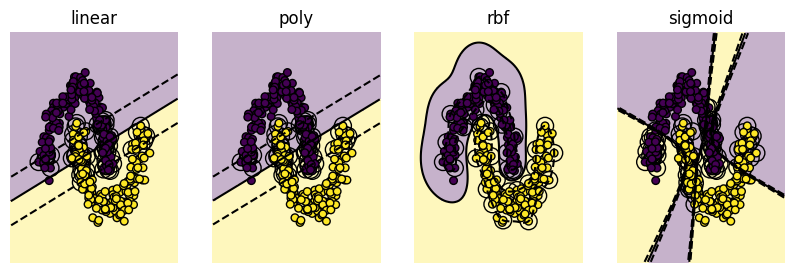

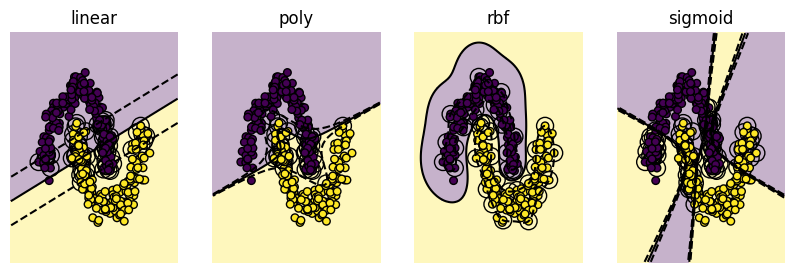

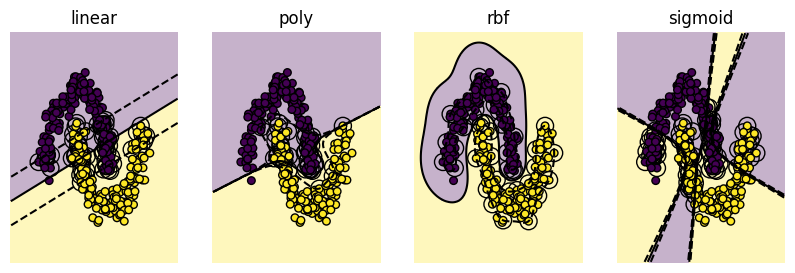

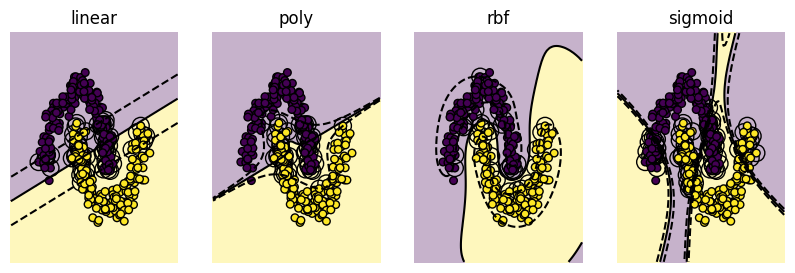

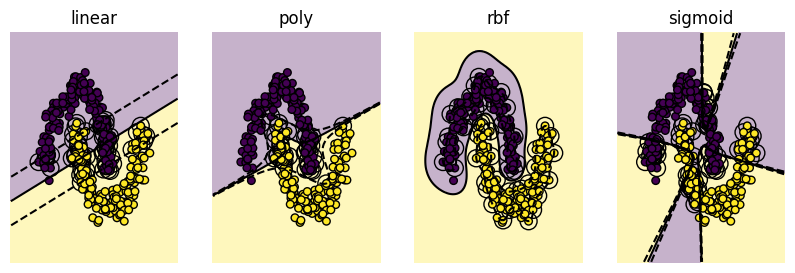

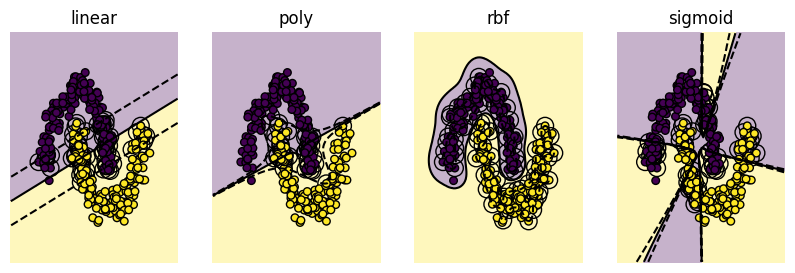

In [ ]:
# moon dataset
print("MOON DATA SET")

# first keep gamma constant and increment degree
for d in range(1, 6, 2):
    print("Degree: ", d)
    moons_dict, moons_fig = kernel_comparison(moons_X, moons_y, degree=d, gamma=3)
    print(moons_dict)

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Gamma: ", g)
    moons_dict, moons_fig = kernel_comparison(moons_X, moons_y, degree=3, gamma=g)
    print(moons_dict)

SWISS 2 DATA SET
Degree:  1
{'linear': [0.580952380952381, 0.5888888888888889], 'poly': [0.580952380952381, 0.5888888888888889], 'rbf': [0.9952380952380953, 0.9888888888888889], 'sigmoid': [0.49047619047619045, 0.4222222222222222]}
Degree:  3
{'linear': [0.580952380952381, 0.5888888888888889], 'poly': [0.780952380952381, 0.8222222222222222], 'rbf': [0.9952380952380953, 0.9888888888888889], 'sigmoid': [0.49047619047619045, 0.4222222222222222]}
Degree:  5
{'linear': [0.580952380952381, 0.5888888888888889], 'poly': [0.8, 0.8111111111111111], 'rbf': [0.9952380952380953, 0.9888888888888889], 'sigmoid': [0.49047619047619045, 0.4222222222222222]}
Gamma:  1
{'linear': [0.580952380952381, 0.5888888888888889], 'poly': [0.7904761904761904, 0.8222222222222222], 'rbf': [0.9952380952380953, 1.0], 'sigmoid': [0.42857142857142855, 0.4]}
Gamma:  5
{'linear': [0.580952380952381, 0.5888888888888889], 'poly': [0.780952380952381, 0.8222222222222222], 'rbf': [0.9952380952380953, 0.9888888888888889], 'sigmoi

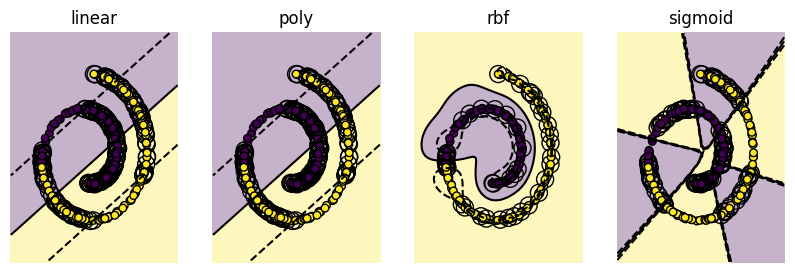

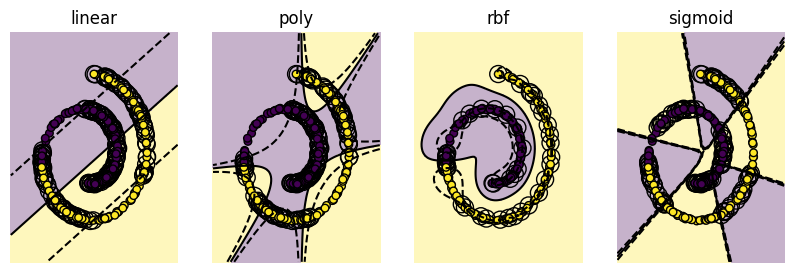

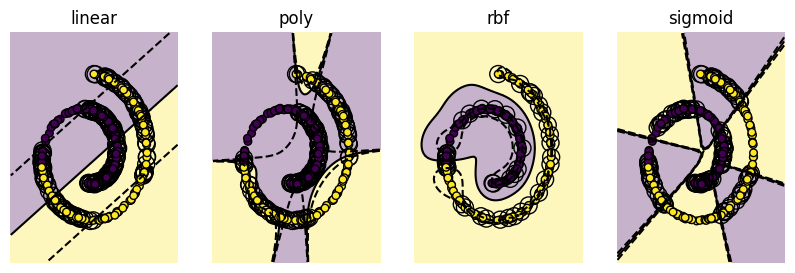

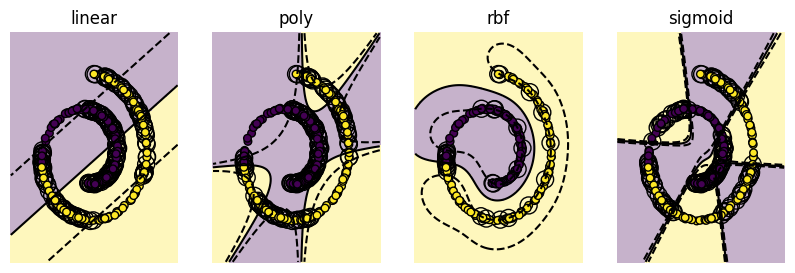

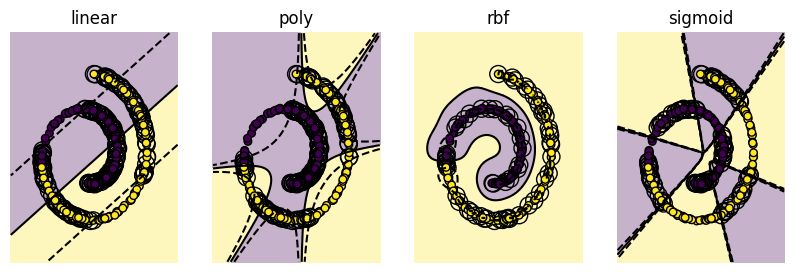

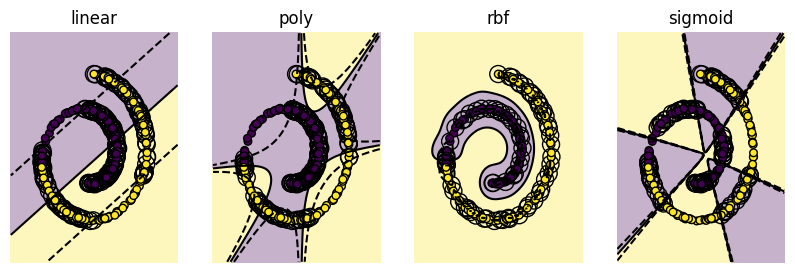

In [ ]:
# swiss 2 data set
print("SWISS 2 DATA SET")

# first keep gamma constant and increment degree
for d in range(1, 6, 2):
    print("Degree: ", d)
    swiss_2_dict, swiss_2_fig = kernel_comparison(swiss_2_X, swiss_2_y, degree=d, gamma=3)
    print(swiss_2_dict)

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Gamma: ", g)
    swiss_2_dict, swiss_2_fig = kernel_comparison(swiss_2_X, swiss_2_y, degree=3, gamma=g)
    print(swiss_2_dict)

SWISS 10 DATA SET
Degree:  1
{'linear': [0.4714285714285714, 0.5444444444444444], 'poly': [0.4714285714285714, 0.5444444444444444], 'rbf': [0.9476190476190476, 0.9111111111111111], 'sigmoid': [0.2523809523809524, 0.28888888888888886]}
Degree:  3
{'linear': [0.4714285714285714, 0.5444444444444444], 'poly': [0.7952380952380952, 0.7444444444444445], 'rbf': [0.9476190476190476, 0.9111111111111111], 'sigmoid': [0.2523809523809524, 0.28888888888888886]}
Degree:  5
{'linear': [0.4714285714285714, 0.5444444444444444], 'poly': [0.7428571428571429, 0.6666666666666666], 'rbf': [0.9476190476190476, 0.9111111111111111], 'sigmoid': [0.2523809523809524, 0.28888888888888886]}
Gamma:  1
{'linear': [0.4714285714285714, 0.5444444444444444], 'poly': [0.7952380952380952, 0.7555555555555555], 'rbf': [0.9285714285714286, 0.8666666666666667], 'sigmoid': [0.24761904761904763, 0.26666666666666666]}
Gamma:  5
{'linear': [0.4714285714285714, 0.5444444444444444], 'poly': [0.7952380952380952, 0.7444444444444445], '

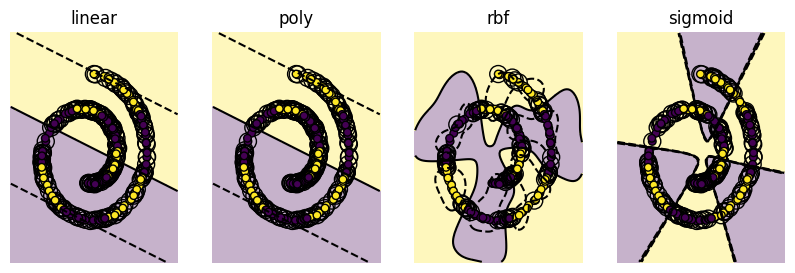

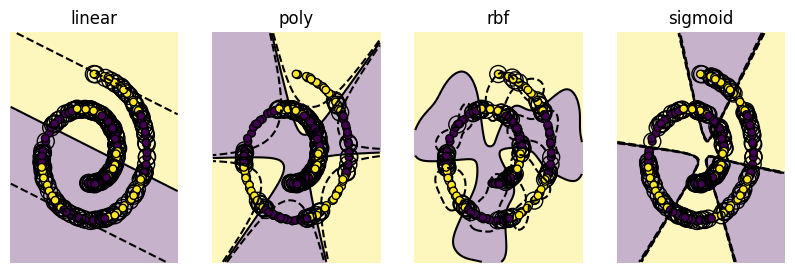

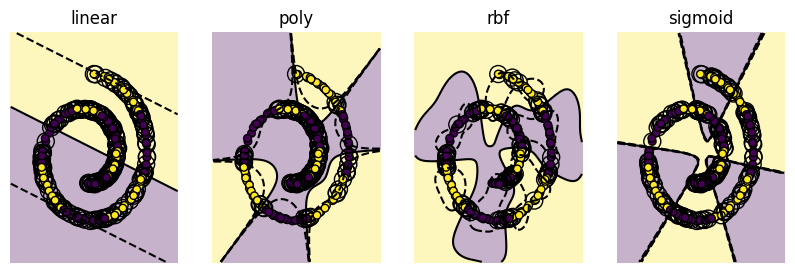

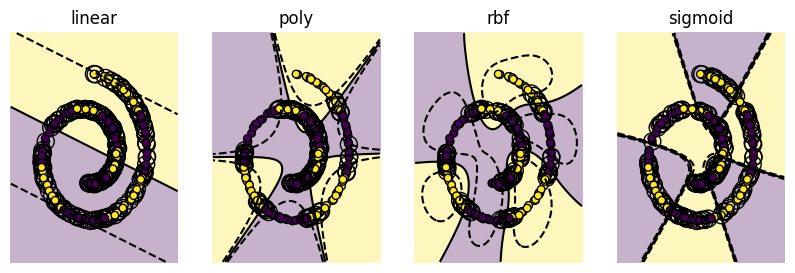

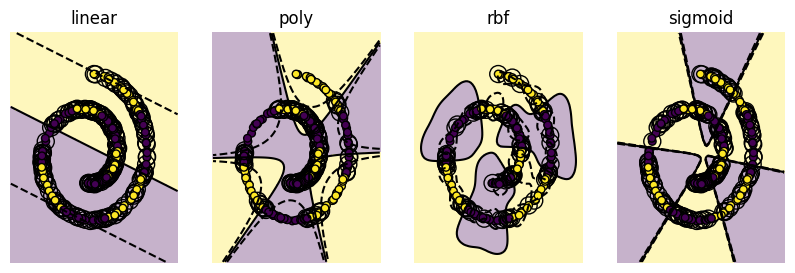

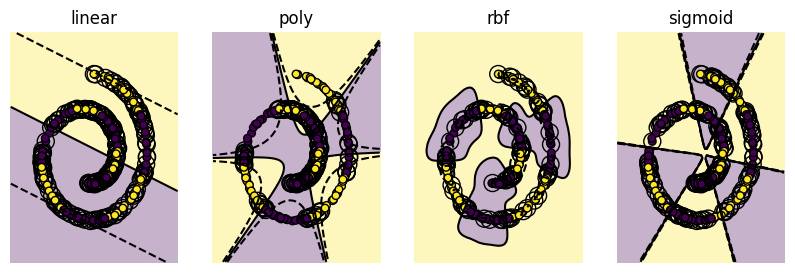

In [ ]:
# swiss 10 data set
print("SWISS 10 DATA SET")

# first keep gamma constant and increment degree
for d in range(1, 6, 2):
    print("Degree: ", d)
    swiss_10_dict, swiss_10_fig = kernel_comparison(swiss_10_X, swiss_10_y, degree=d, gamma=3)
    print(swiss_10_dict)

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Gamma: ", g)
    swiss_10_dict, swiss_10_fig = kernel_comparison(swiss_10_X, swiss_10_y, degree=3, gamma=g)
    print(swiss_10_dict)

S CURVE 2 DATA SET
Degree:  1
{'linear': [0.9904761904761905, 0.9666666666666667], 'poly': [0.9857142857142858, 0.9666666666666667], 'rbf': [0.9904761904761905, 0.9555555555555556], 'sigmoid': [0.7142857142857143, 0.7888888888888889]}
Degree:  3
{'linear': [0.9904761904761905, 0.9666666666666667], 'poly': [0.9619047619047619, 0.9666666666666667], 'rbf': [0.9904761904761905, 0.9555555555555556], 'sigmoid': [0.7142857142857143, 0.7888888888888889]}
Degree:  5
{'linear': [0.9904761904761905, 0.9666666666666667], 'poly': [0.9571428571428572, 0.9555555555555556], 'rbf': [0.9904761904761905, 0.9555555555555556], 'sigmoid': [0.7142857142857143, 0.7888888888888889]}
Degree:  1
{'linear': [0.9904761904761905, 0.9666666666666667], 'poly': [0.9571428571428572, 0.9555555555555556], 'rbf': [0.9857142857142858, 0.9555555555555556], 'sigmoid': [0.8666666666666667, 0.9]}
Degree:  5
{'linear': [0.9904761904761905, 0.9666666666666667], 'poly': [0.9619047619047619, 0.9666666666666667], 'rbf': [0.99047619

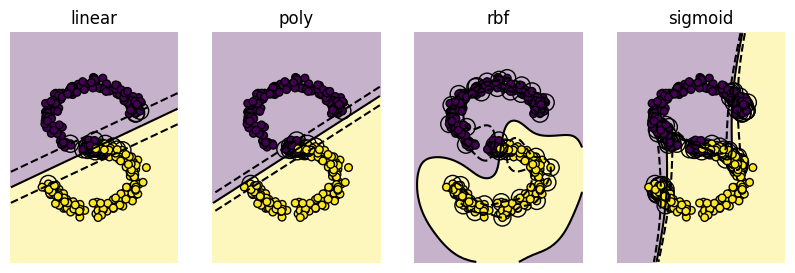

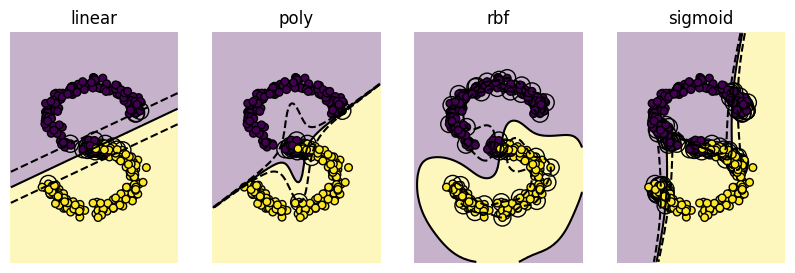

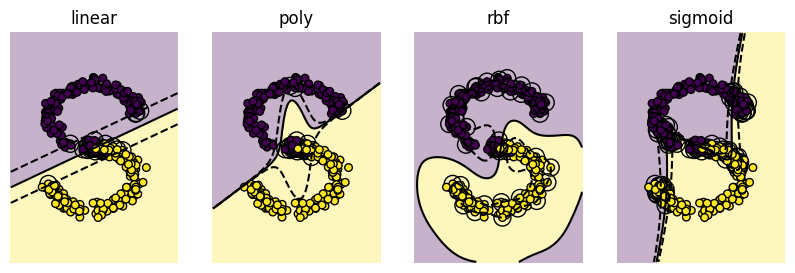

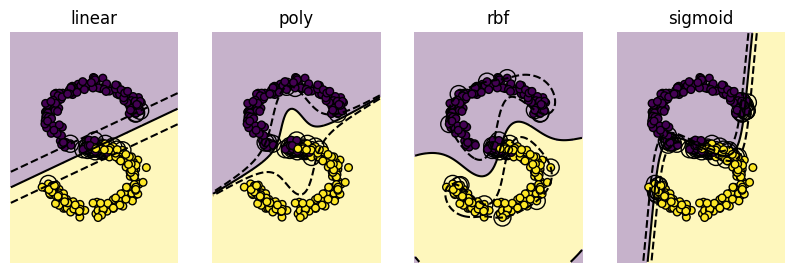

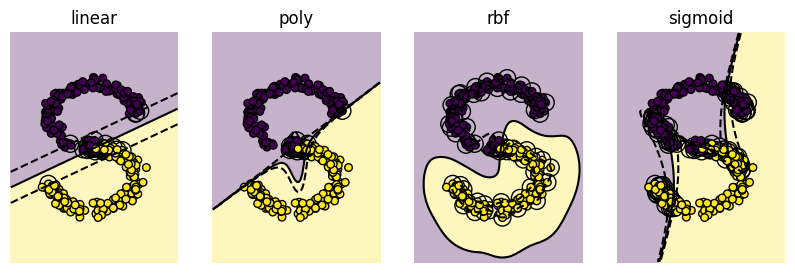

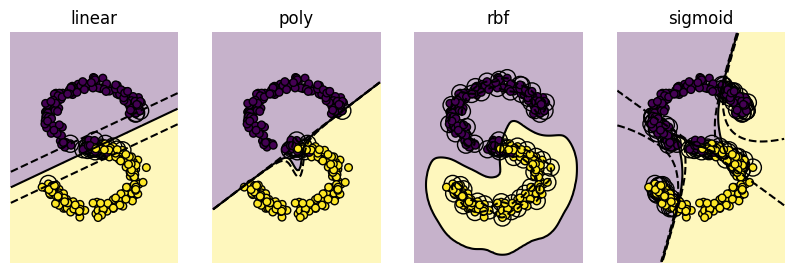

In [ ]:
# s curve 2 data set
print("S CURVE 2 DATA SET")

# first keep gamma constant and increment degree
for d in range(1, 6, 2):
    print("Degree: ", d)
    s_curve_2_dict, s_curve_2_fig = kernel_comparison(s_curve_2_X, s_curve_2_y, degree=d, gamma=3)
    print(s_curve_2_dict)

# now keep degree constant and increment gamma
for g in range(1, 10, 4):
    print("Degree: ", g)
    s_curve_2_dict, s_curve_2_fig = kernel_comparison(s_curve_2_X, s_curve_2_y, degree=3, gamma=g)
    print(s_curve_2_dict)

S CURVE 10 DATA SET
Degree:  1
{'linear': [0.5, 0.5666666666666667], 'poly': [0.5, 0.5666666666666667], 'rbf': [0.9095238095238095, 0.8777777777777778], 'sigmoid': [0.45714285714285713, 0.4888888888888889]}
Degree:  3
{'linear': [0.5, 0.5666666666666667], 'poly': [0.7380952380952381, 0.7], 'rbf': [0.9095238095238095, 0.8777777777777778], 'sigmoid': [0.45714285714285713, 0.4888888888888889]}
Degree:  5
{'linear': [0.5, 0.5666666666666667], 'poly': [0.8095238095238095, 0.8], 'rbf': [0.9095238095238095, 0.8777777777777778], 'sigmoid': [0.45714285714285713, 0.4888888888888889]}
Degree:  1
{'linear': [0.5, 0.5666666666666667], 'poly': [0.7380952380952381, 0.7], 'rbf': [0.8809523809523809, 0.8444444444444444], 'sigmoid': [0.47619047619047616, 0.4777777777777778]}
Degree:  5
{'linear': [0.5, 0.5666666666666667], 'poly': [0.7380952380952381, 0.7], 'rbf': [0.9142857142857143, 0.8666666666666667], 'sigmoid': [0.4666666666666667, 0.5111111111111111]}
Degree:  9
{'linear': [0.5, 0.5666666666666667

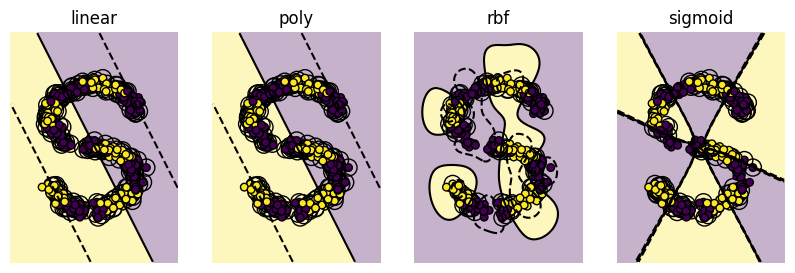

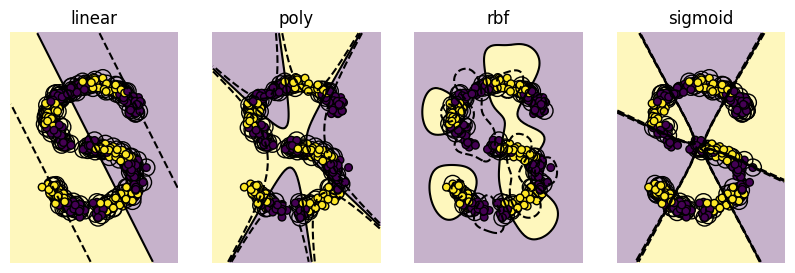

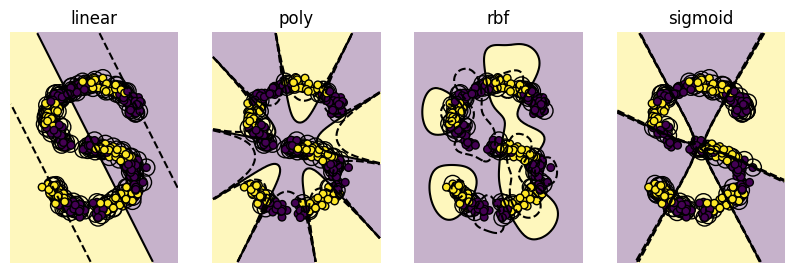

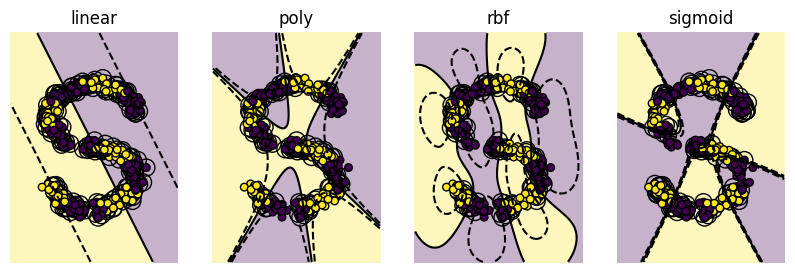

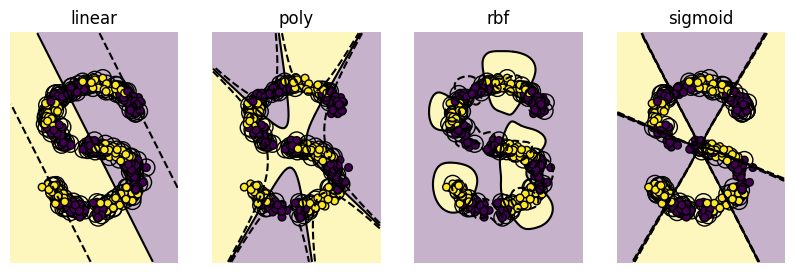

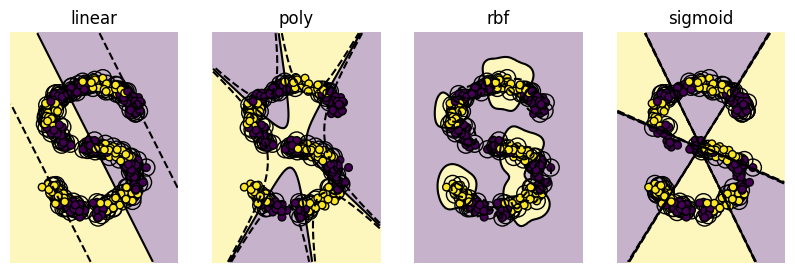

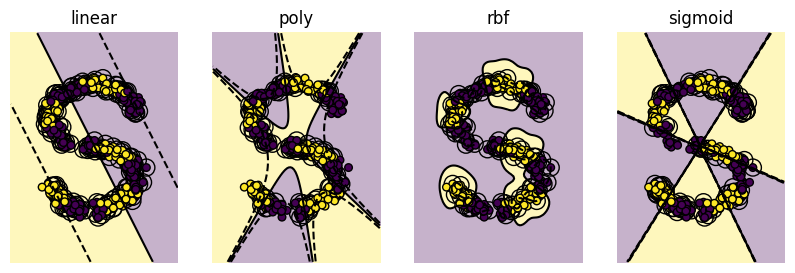

In [ ]:
# s curve 10 data set
print("S CURVE 10 DATA SET")

# first keep gamma constant and increment degree
for d in range(1, 6, 2):
    print("Degree: ", d)
    s_curve_10_dict, s_curve_10_fig = kernel_comparison(s_curve_10_X, s_curve_10_y, degree=d, gamma=3)
    print(s_curve_10_dict)

# now keep degree constant and increment gamma
for g in range(1, 14, 4):
    print("Degree: ", g)
    s_curve_10_dict, s_curve_10_fig = kernel_comparison(s_curve_10_X, s_curve_10_y, degree=3, gamma=g)
    print(s_curve_10_dict)


The `degree` argument affects pretty much every data generation method as shown above. Particuarly, the polynomial based models are affected It changes the model by changing the degreee of the degree-based SVC, where a lower degree value results in simpler functions and higher degree results in more complex functions. This affects the model's bias-variance tradeoff by increasing the models complexity as the degree increases, which will potentially lead to high varience and therefore overfitting.

As one increases the `degree`, the decision boundary becomes more malluable and thus being a better/closer fit to the training data.

The `gamma` argument affects pretty much every data generation method as shown above. It changes the model by changing the **rbf kernel function**. The RBF function stands for "Radical Basis Function". Particiarly, gamma "defines how far the influence of a single training example reaches". When gamma is higher, the the influence of a single training example is much lower and it can only reach closer points.This affects the model's bias-variance tradeoff by leading to a potentially overfit model (i.e. with high varience) with a high value of gamma.

As one increases `gamma`, the decision boundary of the SVM also becomes more malluable and fits the data more tightly. Additionally, it can be "more" non-linear and be able to capture even more complex relationships.


## Part 2: US Flags

### Part 2.1: Load and explore flags data
The function `load_images` loads the image data from the flags folder and turns each image into a binary (i.e., black and white) array.

1. Load the flags data.
2. Display four flags of your choice in a figure. Use the `matplotlib` commands `subplot` and `imshow` to create a figure with 2x2 flags. Consult the `matplotlib` documentation to find a way set the aspect ratio of your displayed flags to match their original aspect ratio. Update your code accordingly.

In [ ]:
def load_images(folder):
    images = []
    labels = []
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert image to black and white
            img = np.array(img)//(256/2) # Convert to BW
            images.append(img)
            labels.append(filename.split('.')[0])  # Extract the state code as label
    return images, labels

In [ ]:
# Load images from google drive folder
folder = '/content/drive/MyDrive/24X/M76/flags'
images, labels = load_images(folder)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


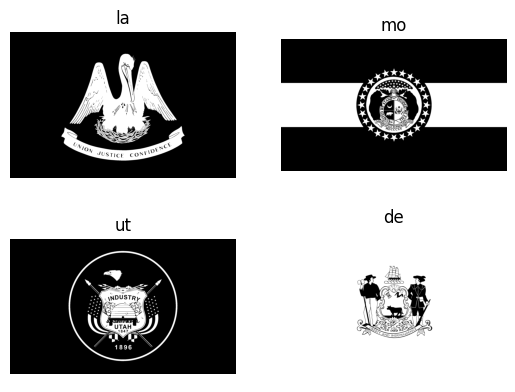

In [ ]:
# Display four black-and-white flags in a 2x2 grid
fig, axs = plt.subplots(2, 2)

selected_images = images[:4]
selected_labels = labels[:4]

# Iterate over the selected images and labels
for i in range(2):
  for j in range(2):
    index = i * 2 + j
    axs[i, j].imshow(selected_images[index], cmap='gray', aspect='equal')
    axs[i, j].set_title(selected_labels[index])
    axs[i, j].axis('off')

plt.show()

### Part 2.2: SVMs for flag pixel data
The function `sample_pixels` samples a pixel from a given image uniformly at random.

1. Use the `sample_pixels`  function to generate synthetic data sets of pixels from for a flag image.
2. Update the `kernel_comparison` function so that if `if_flag` is `True` the decision boundaries are plotted in a 2x2 grid of subplots with plot ranges matching the height and width of the flags.
3. Show the results of the kernel comparison for the four flags that your previously selected. Use the highest values of `degree` and `gamma` that still run *reasonably fast* on your laptop.
4. Adjust your code so that you can run the quantitative part (i.e., the calculation of train and test accuracy) without plotting the decision boundaries. Run the adjusted code on all flags to indentify for each kernel the flags that yield to best easiest-to-classify and hardest-to-classify data sets. Test how the number of of pixels sampled affects your results.

In [ ]:
def sample_pixels(image, num_samples=100):
    pixel_data = []
    pixel_labels = []
    height, width = image.shape
    for _ in range(num_samples):
        x1 = random.randint(0, width - 1)
        x2 = random.randint(0, height - 1)
        pixel_data.append([x1/width-0.5, x2/width-0.5])
        pixel_labels.append(image[x2,x1])
    return np.array(pixel_data), np.array(pixel_labels, dtype=int)

la: {'linear': [0.84, 0.8133333333333334], 'poly': [0.84, 0.8133333333333334], 'rbf': [0.84, 0.8133333333333334], 'sigmoid': [0.8257142857142857, 0.7933333333333333]}
mo: {'linear': [0.7171428571428572, 0.76], 'poly': [0.7171428571428572, 0.76], 'rbf': [0.72, 0.76], 'sigmoid': [0.6542857142857142, 0.7066666666666667]}
ut: {'linear': [0.9142857142857143, 0.94], 'poly': [0.9142857142857143, 0.94], 'rbf': [0.9142857142857143, 0.94], 'sigmoid': [0.9142857142857143, 0.94]}
de: {'linear': [0.9485714285714286, 0.92], 'poly': [0.9485714285714286, 0.92], 'rbf': [0.9485714285714286, 0.92], 'sigmoid': [0.9485714285714286, 0.92]}


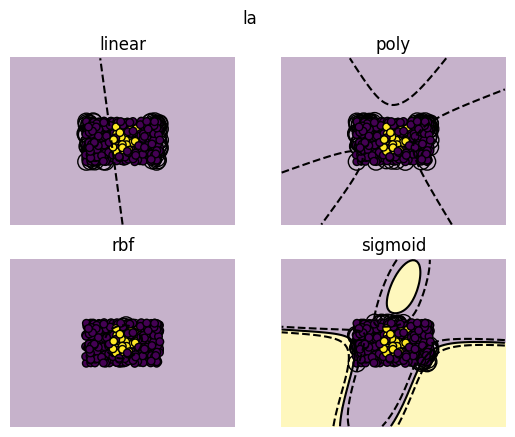

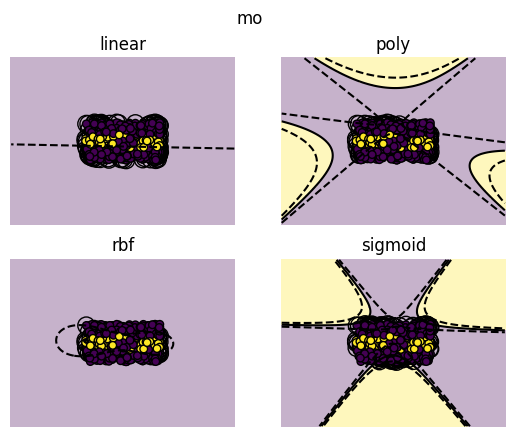

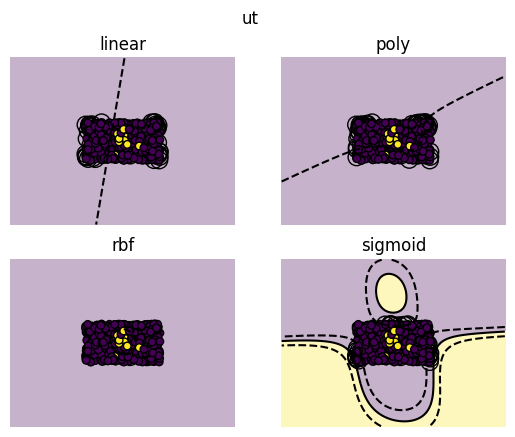

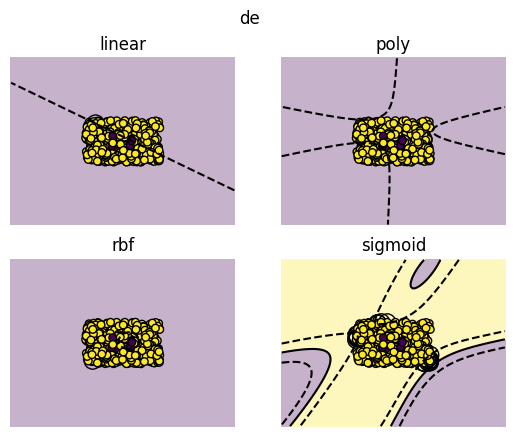

In [ ]:
# Visual kernel comparison for selected flags
for i in range(2):
  for j in range(2):
    index = i * 2 + j
    #
    flags_X, flags_y = sample_pixels(selected_images[index], num_samples=500)
    flag_dict, flag_fig = kernel_comparison(flags_X, flags_y, if_flag=True)
    flag_fig.suptitle(selected_labels[index])
    print(f'{selected_labels[index]}: {flag_dict}')


In [ ]:
# Non-visual kernel comparison for all flags
def run_kernel_comparison(X, y, degree=3, gamma=3):
    # Train test split should be at BEGINING of the function
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # dictionary to keep track of accuracy
    dict = {}

    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = svm.SVC(kernel=kernel, degree=degree, gamma=gamma).fit(X_train, y_train)

        # Compute train and test accuracy
        y_train_pred = clf.predict(X_train)
        y_test_pred = clf.predict(X_test)
        train_accuracy = accuracy_score(y_train, y_train_pred)
        test_accuracy = accuracy_score(y_test, y_test_pred)
        dict[kernel] = [train_accuracy, test_accuracy]

    return dict

In [ ]:
def all_flags_kernel_comparison(images, labels):

  results = {'flag': labels, 'linear_train': [], 'linear_test': [], 'poly_train': [], 'poly_test': [], 'rbf_train': [], 'rbf_test': [], 'sigmoid_train': [], 'sigmoid_test': []}

  for image, label in zip(images, labels):
    flag_X, flag_y = sample_pixels(image, num_samples=500)
    flag_dict = run_kernel_comparison(flag_X, flag_y)

    results['linear_train'].append(flag_dict['linear'][0])
    results['linear_test'].append(flag_dict['linear'][1])
    results['poly_train'].append(flag_dict['poly'][0])
    results['poly_test'].append(flag_dict['poly'][1])
    results['rbf_train'].append(flag_dict['rbf'][0])
    results['rbf_test'].append(flag_dict['rbf'][1])
    results['sigmoid_train'].append(flag_dict['sigmoid'][0])
    results['sigmoid_test'].append(flag_dict['sigmoid'][1])

  df_results = pd.DataFrame(results)
  return df_results


In [ ]:
def flag_kernel_results(df_results, sort_column):
  df_sorted = df_results.sort_values(by=sort_column, ascending=False)

  # Get the top 3 and bottom 3 labels and values
  top_3 = df_sorted.head(3)
  bottom_3 = df_sorted.tail(3)

  print(f'Top 3 flags by {sort_column} accuracy:')
  print(top_3[['flag', sort_column]])

  print(f'\nBottom 3 flags by {sort_column} accuracy:')
  print(bottom_3[['flag', sort_column]])

In [ ]:
df_results = all_flags_kernel_comparison(images, labels)
df_results

,flag,linear_train,linear_test,poly_train,poly_test,rbf_train,rbf_test,sigmoid_train,sigmoid_test
0,la,0.845714,0.813333,0.845714,0.813333,0.845714,0.813333,0.828571,0.800000
1,mo,0.722857,0.706667,0.722857,0.706667,0.722857,0.706667,0.697143,0.680000
2,ut,0.902857,0.900000,0.902857,0.900000,0.902857,0.900000,0.897143,0.900000
3,de,0.968571,0.973333,0.968571,0.973333,0.968571,0.973333,0.968571,0.973333
4,tx,0.877143,0.846667,0.880000,0.820000,0.942857,0.933333,0.745714,0.693333
5,mt,0.860000,0.813333,0.860000,0.813333,0.860000,0.813333,0.828571,0.773333
6,wy,0.785714,0.860000,0.785714,0.860000,0.785714,0.860000,0.734286,0.826667
7,ca,0.822857,0.773333,0.780000,0.786667,0.840000,0.813333,0.831429,0.766667
8,nj,0.908571,0.906667,0.908571,0.906667,0.908571,0.906667,0.905714,0.906667
9,ri,0.988571,0.986667,0.988571,0.986667,0.988571,0.986667,0.988571,0.986667


For these experiments, I set `num_samples` to 500 because the results of the experiments seem to be the most stable for this number of sampled pixels.

The linear kernel performed best (i.e., highest test accuracy) on the flags of the following three states:

Alaska, New Mexico, Rhode Island

It performed worst on the flags of the following three states:

Florida, Maryland, Indiana

In [ ]:
flag_kernel_results(df_results, 'linear_test')

Top 3 flags by linear_test accuracy:
   flag  linear_test
30   ak     0.993333
48   nm     0.986667
9    ri     0.986667

Bottom 3 flags by linear_test accuracy:
   flag  linear_test
32   fl     0.593333
31   md     0.573333
47   ia     0.573333


The polynomial kernel performed best on the flags of the following three states:

Alaska, Rhode Island, New Mexico

It performed worst on the flags of the following three states:

Florida, Indiana, Maryland

In [ ]:
flag_kernel_results(df_results, 'poly_test')

Top 3 flags by poly_test accuracy:
   flag  poly_test
30   ak   0.993333
9    ri   0.986667
48   nm   0.986667

Bottom 3 flags by poly_test accuracy:
   flag  poly_test
32   fl   0.593333
47   ia   0.586667
31   md   0.566667


The radial-basis function kernel performed best on the flags of the following three states:

Alaska, Rhode Island, New Mexico

It performed worst on the flags of the following three states:

Alabama, Florida, Maryland

In [ ]:
flag_kernel_results(df_results, 'rbf_test')

Top 3 flags by rbf_test accuracy:
   flag  rbf_test
30   ak  0.993333
9    ri  0.986667
48   nm  0.986667

Bottom 3 flags by rbf_test accuracy:
   flag  rbf_test
43   al  0.626667
32   fl  0.593333
31   md  0.553333


The sigmoid kernel performed best on the flags of the following three states:

Alaska, Rhode Island, New Mexico

It performed worst on the flags of the following three states:

Alabama, Maryland, Iowa

In [ ]:
flag_kernel_results(df_results, 'sigmoid_test')

Top 3 flags by sigmoid_test accuracy:
   flag  sigmoid_test
30   ak      0.993333
9    ri      0.986667
48   nm      0.986667

Bottom 3 flags by sigmoid_test accuracy:
   flag  sigmoid_test
43   al      0.493333
31   md      0.480000
47   ia      0.380000


### Part 2.3: Comparison to decision trees
Decision trees and SVMs yield substantially different decision boundaries.

1. An arbitrarily complex decision tree would be able to achieve perfect training accuracy on any data set. Explain why.

An arbitrarily complex decision tree can achieve perfect training accuracy on any data set because it can keep splitting the data until each data point is isolated in its own leaf node. This means that the tree can create a highly specific model that perfectly fits the training data, capturing all the nuances and irregularities of the data set, including noise.


2. For a very large data set of flag pixels, an arbitrarily complex decision tree is likely to achieve (almost) perfect test accuracy as well. Explain why.

For a very large data set of flag pixels, an arbitrarily complex decision tree is likely to achieve (almost) perfect test accuracy because the vast amount of data provides a comprehensive representation of the underlying patterns and relationships. With enough data, the decision tree can generalize well, capturing the true distribution of the data and thus performing well on the test set. However, this assumes that the data is sufficiently representative and not overly noisy.


3. Select four flags for which you anticipate a *simple* decision tree to outperform all your SVMs. Write code that fits a decision tree to a flag pixel data set. Use your code to check your hypothesis.

To select four flags, I would choose ones with distinct and simple patterns that are easily separable, but ones with multiple linear boundaries would work best for a decision tree - like a flag with stripes. Examples include: **Colorado, Georgia, Missouri, North Carolina**.

In [ ]:
# Comparison of SVM and decision tree performance on sampled pixel data for four flags
def decision_tree(X, y):
  dict = {}

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

  dt_clf = DecisionTreeClassifier(max_depth=5)
  dt_clf.fit(X_train, y_train)
  dt_train_acc = accuracy_score(y_train, dt_clf.predict(X_train))
  dt_test_acc = accuracy_score(y_test, dt_clf.predict(X_test))

  dict["dt"] = [dt_train_acc, dt_test_acc]

  return dict

In [ ]:
# Create dataframe of all test results and decision tree results constructed from same random sampling
results = {'flag': labels, 'linear_train': [], 'linear_test': [], 'poly_train': [], 'poly_test': [], 'rbf_train': [], 'rbf_test': [], 'sigmoid_train': [], 'sigmoid_test': [], 'dt_train': [], 'dt_test': []}

for image, label in zip(images, labels):
    flag_X, flag_y = sample_pixels(image, num_samples=500)
    flag_dict = run_kernel_comparison(flag_X, flag_y)
    dt_dict = decision_tree(flag_X, flag_y)

    results['linear_train'].append(flag_dict['linear'][0])
    results['linear_test'].append(flag_dict['linear'][1])
    results['poly_train'].append(flag_dict['poly'][0])
    results['poly_test'].append(flag_dict['poly'][1])
    results['rbf_train'].append(flag_dict['rbf'][0])
    results['rbf_test'].append(flag_dict['rbf'][1])
    results['sigmoid_train'].append(flag_dict['sigmoid'][0])
    results['sigmoid_test'].append(flag_dict['sigmoid'][1])
    results['dt_train'].append(dt_dict['dt'][0])
    results['dt_test'].append(dt_dict['dt'][1])

df_results = pd.DataFrame(results)
df_results



,flag,linear_train,linear_test,poly_train,poly_test,rbf_train,rbf_test,sigmoid_train,sigmoid_test,dt_train,dt_test
0,la,0.882857,0.826667,0.882857,0.826667,0.882857,0.826667,0.868571,0.820000,0.948571,0.880000
1,mo,0.705714,0.720000,0.705714,0.720000,0.791429,0.800000,0.568571,0.586667,0.954286,0.913333
2,ut,0.891429,0.893333,0.891429,0.893333,0.891429,0.893333,0.862857,0.886667,0.948571,0.906667
3,de,0.960000,0.973333,0.960000,0.973333,0.960000,0.973333,0.960000,0.973333,0.988571,0.920000
4,tx,0.880000,0.840000,0.877143,0.840000,0.951429,0.900000,0.771429,0.766667,0.994286,0.926667
5,mt,0.820000,0.773333,0.820000,0.773333,0.820000,0.773333,0.777143,0.726667,0.917143,0.886667
6,wy,0.822857,0.793333,0.822857,0.793333,0.822857,0.793333,0.774286,0.773333,0.925714,0.880000
7,ca,0.811429,0.846667,0.771429,0.780000,0.782857,0.846667,0.822857,0.860000,0.928571,0.920000
8,nj,0.908571,0.960000,0.908571,0.960000,0.908571,0.960000,0.905714,0.953333,0.920000,0.953333
9,ri,0.991429,0.980000,0.991429,0.980000,0.991429,0.980000,0.991429,0.980000,0.997143,0.973333


In [ ]:
df_results.head()

,flag,linear_train,linear_test,poly_train,poly_test,rbf_train,rbf_test,sigmoid_train,sigmoid_test,dt_train,dt_test
0,la,0.882857,0.826667,0.882857,0.826667,0.882857,0.826667,0.868571,0.820000,0.948571,0.880000
1,mo,0.705714,0.720000,0.705714,0.720000,0.791429,0.800000,0.568571,0.586667,0.954286,0.913333
2,ut,0.891429,0.893333,0.891429,0.893333,0.891429,0.893333,0.862857,0.886667,0.948571,0.906667
3,de,0.960000,0.973333,0.960000,0.973333,0.960000,0.973333,0.960000,0.973333,0.988571,0.920000
4,tx,0.880000,0.840000,0.877143,0.840000,0.951429,0.900000,0.771429,0.766667,0.994286,0.926667


In [ ]:
# filter dataframe for only flags for which the decision tree outperformed all kernels.

filtered_df = df_results[(df_results['dt_test'] > df_results['linear_test']) &
                 (df_results['dt_test'] > df_results['poly_test']) &
                 (df_results['dt_test'] > df_results['rbf_test']) &
                 (df_results['dt_test'] > df_results['sigmoid_test'])]

filtered_df.head()

,flag,linear_train,linear_test,poly_train,poly_test,rbf_train,rbf_test,sigmoid_train,sigmoid_test,dt_train,dt_test
0,la,0.882857,0.826667,0.882857,0.826667,0.882857,0.826667,0.868571,0.820000,0.948571,0.880000
1,mo,0.705714,0.720000,0.705714,0.720000,0.791429,0.800000,0.568571,0.586667,0.954286,0.913333
2,ut,0.891429,0.893333,0.891429,0.893333,0.891429,0.893333,0.862857,0.886667,0.948571,0.906667
4,tx,0.880000,0.840000,0.877143,0.840000,0.951429,0.900000,0.771429,0.766667,0.994286,0.926667
5,mt,0.820000,0.773333,0.820000,0.773333,0.820000,0.773333,0.777143,0.726667,0.917143,0.886667


In [ ]:
# Sort filtered dataframe by highest decision tree test accuracy
best_dt_df = filtered_df.sort_values(by='dt_test', ascending=False)
best_dt_df.head(10)

,flag,linear_train,linear_test,poly_train,poly_test,rbf_train,rbf_test,sigmoid_train,sigmoid_test,dt_train,dt_test
39,co,0.737143,0.733333,0.737143,0.733333,0.854286,0.806667,0.674286,0.693333,0.965714,0.986667
45,ga,0.797143,0.813333,0.797143,0.813333,0.797143,0.813333,0.725714,0.733333,0.974286,0.960000
41,ms,0.900000,0.880000,0.900000,0.880000,0.900000,0.880000,0.894286,0.873333,0.962857,0.953333
34,in,0.925714,0.946667,0.925714,0.946667,0.925714,0.946667,0.925714,0.946667,0.957143,0.953333
49,nc,0.811429,0.860000,0.788571,0.800000,0.914286,0.913333,0.731429,0.740000,0.971429,0.946667
42,wi,0.900000,0.933333,0.900000,0.933333,0.900000,0.933333,0.877143,0.906667,0.934286,0.940000
28,vt,0.922857,0.926667,0.922857,0.926667,0.922857,0.926667,0.922857,0.926667,0.968571,0.940000
15,ky,0.922857,0.933333,0.922857,0.933333,0.922857,0.933333,0.920000,0.933333,0.971429,0.940000
20,ks,0.891429,0.886667,0.891429,0.886667,0.891429,0.886667,0.865714,0.873333,0.971429,0.933333
4,tx,0.880000,0.840000,0.877143,0.840000,0.951429,0.900000,0.771429,0.766667,0.994286,0.926667


As we can see, Colorado, Georga, Missouri, and North Carolina all appear in the top 10 most accurately predicted flags using the decision tree.